# Setup and Imports

In [2]:
# --------------------------------------
# CELL 1: Setup & Imports
# --------------------------------------

# Core Python
import os
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from copy import deepcopy
import warnings
warnings.filterwarnings('ignore')

# Astropy: IO, coordinates, WCS, units
from astropy.io import fits
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
import astropy.units as u

# Astropy: Stats & visualization
from astropy.stats import sigma_clipped_stats
from astropy.visualization import (
    simple_norm, ImageNormalize, AsinhStretch, PercentileInterval
)

# WCS alignment
from reproject import reproject_interp

# Convolution and PSF matching
from astropy.convolution import convolve_fft, Gaussian2DKernel
from photutils.psf.matching import create_matching_kernel
from scipy.ndimage import gaussian_filter

# Photometry
import sep

# Visualization
from matplotlib.patches import Ellipse
import matplotlib.ticker as mtick

# Custom utilities
import utils

# Paths
project_dir = Path.cwd()
data_dir = project_dir / "data"
output_dir = project_dir / "outputs"
output_dir.mkdir(exist_ok=True)

# Matplotlib setup
plt.rcParams["font.size"] = 14
plt.rcParams["figure.figsize"] = (8, 6)

# Confirm environment
print(f"Notebook initialized in: {project_dir}")


Notebook initialized in: /Users/alberto/Desktop/DTU/ESPE-Space_Research/3rd_Semester/Synthesis/notebooks


# Load data provided

In [3]:
# --------------------------------------
# CELL 2: Load Input Files and Setup
# --------------------------------------

# Plot styling
plt.rcParams.update({
    'font.size': 20, 'axes.labelsize': 20, 'axes.linewidth': 2, 
    'xtick.minor.width': 2, 'xtick.major.width': 2, 
    'ytick.major.width': 2, 'ytick.minor.width': 2
})

# Target info
target_id = 'z63'
target_label = 'z6.3'
forced_band = 'Band 7'  # Band used for segmentation and forced photometry
zsp = 6.0719
cutout_size_arcsec = 5.0

# Target coordinates (RA/DEC in FK5)
coord = SkyCoord(ra='06 00 09.55', dec='-20 08 11.26', unit=(u.hourangle, u.deg), frame='fk5')
ra_tar, dec_tar = coord.ra.deg, coord.dec.deg

# JWST band filenames and setup
jwst_band_files = {
    'f115w': 'rxcj0600-grizli-v5.0-f115w-clear_drc_sci.fits.gz',
    'f150w': 'rxcj0600-grizli-v5.0-f150w-clear_drc_sci.fits.gz',
    'f277w': 'rxcj0600-grizli-v5.0-f277w-clear_drc_sci.fits.gz',
    'f356w': 'rxcj0600-grizli-v5.0-f356w-clear_drc_sci.fits.gz',
    'f444w': 'rxcj0600-grizli-v5.0-f444w-clear_drc_sci.fits.gz'  # Reference
}
jwst_basepath = '../z6/nircam/rxcj0600-grizli-v5.0/Prep/'

jwst_images, jwst_wcs_list, jwst_headers, jwst_band_names = [], [], [], []

for band, filename in jwst_band_files.items():
    path = os.path.join(jwst_basepath, filename)
    with fits.open(path) as hdu:
        jwst_images.append(hdu[0].data)
        jwst_wcs_list.append(WCS(hdu[0]))
        jwst_headers.append(hdu[0].header)
        jwst_band_names.append(band)

print(f"Loaded {len(jwst_images)} JWST bands: {jwst_band_names}")

# ALMA band FITS paths and labels
alma_fits_paths = [
    "../z6/band9/z63_cont_tcleaned_briggs0.5_image.fits",
    "../z6/band8/z6.3_cont_flag_fwhm2_tcleaned_briggs2.0_image_tap0.5.fits",
    "../z6/band7/z6.3_cont_flag_fwhm4_tcleaned_briggs2.0_image.fits",
    "../z6/band7_oi/z6.3_cont_flag_fwhm4_tcleaned_briggs2.0_image.fits",
    "../z6/band6/integ/z6.3_cont_flag_fwhm4_tcleaned_briggs2.0_image.fits",
    "../z6/band6/c5/z6.3_cont_flag_fwhm4_tcleaned_briggs2.0_image.fits",
    "../z6/band6/c2/z6.3_cont_flag_fwhm4_tcleaned_briggs2.0_image.fits",
    "../z6/band5/z6.3_cont_flag_fwhm4_tcleaned_briggs2.0_image.fits",
    "../z6/band3/ALCS_z6.cont.tcleaned.briggs2.0_image.fits"
]
alma_band_names = ['Band 9','Band 8', 'Band 7', 'Band 7 [OI]', 'Band 6 (C5+C2)', 'Band 6 (C5)', 'Band 6 (C2)', 'Band 5', 'Band 3']
alma_label_names = ['50 μm','88 μm', '122 μm', '146 μm', '158 μm (C5+C2)', '158 μm (C5)', '158 μm (C2)','205 μm', '370 μm']
alma_freq_ghz = [602., 340., 245., 205., 190., 190., 190., 146., 88.]
alma_pixel_scale = [0.15] * len(alma_fits_paths)  # Update if needed

# Compute RMS noise (Jy/beam) per band
alma_rms = []
for path in alma_fits_paths:
    with fits.open(path) as hdu:
        img = hdu[0].data[0, 0, :, :]  # assumes 4D image (Stokes)
        _, _, r = sigma_clipped_stats(img, sigma=3.0, maxiters=5)
        alma_rms.append(r)
alma_rms = np.array(alma_rms)

# Read synthesized beam parameters from FITS headers
alma_beam_major = []
alma_beam_minor = []
alma_beam_pa = []

for path in alma_fits_paths:
    with fits.open(path) as hdu:
        hdr = hdu[0].header
        alma_beam_major.append(hdr.get('BMAJ', np.nan) * 3600)  # deg → arcsec
        alma_beam_minor.append(hdr.get('BMIN', np.nan) * 3600)
        alma_beam_pa.append(hdr.get('BPA', np.nan))             # already in degrees

alma_beam_major = np.array(alma_beam_major)
alma_beam_minor = np.array(alma_beam_minor)
alma_beam_pa = np.array(alma_beam_pa)

# Beam area in arcsec² (for PSF matching and Jy/beam ↔ Jy/pixel conversions)
alma_beam_area = np.pi * alma_beam_major * alma_beam_minor / (4. * np.log(2.))

# Optional print for verification
for bname, bmaj, bmin, bpa in zip(alma_band_names, alma_beam_major, alma_beam_minor, alma_beam_pa):
    print(f"{bname}: Beam = {bmaj:.2f} × {bmin:.2f} arcsec @ {bpa:.1f}°")


Loaded 5 JWST bands: ['f115w', 'f150w', 'f277w', 'f356w', 'f444w']
Band 9: Beam = 0.45 × 0.33 arcsec @ 77.7°
Band 8: Beam = 0.66 × 0.58 arcsec @ -82.5°
Band 7: Beam = 0.91 × 0.66 arcsec @ -82.7°
Band 7 [OI]: Beam = 0.85 × 0.67 arcsec @ -88.7°
Band 6 (C5+C2): Beam = 0.44 × 0.38 arcsec @ 47.7°
Band 6 (C5): Beam = 0.35 × 0.29 arcsec @ 44.7°
Band 6 (C2): Beam = 1.26 × 1.05 arcsec @ 87.9°
Band 5: Beam = 1.08 × 0.83 arcsec @ 87.4°
Band 3: Beam = 1.55 × 1.27 arcsec @ -65.7°


In [4]:
# --------------------------------------
# Optional: Header coordinate sanity check (debug only)
# --------------------------------------
from astropy.io import fits

for path in alma_fits_paths:
    with fits.open(path) as hdu:
        hdr = hdu[0].header
        print(f" File: {path.split('/')[-1]}")
        for key in ['RA_TARG', 'DEC_TARG', 'OBJRA', 'OBJDEC', 'CRVAL1', 'CRVAL2']:
            if key in hdr:
                print(f"  {key}: {hdr[key]}")
        print()


 File: z63_cont_tcleaned_briggs0.5_image.fits
  CRVAL1: 90.03979152955
  CRVAL2: -20.13646133521

 File: z6.3_cont_flag_fwhm2_tcleaned_briggs2.0_image_tap0.5.fits
  CRVAL1: 90.03979152955
  CRVAL2: -20.13646133521

 File: z6.3_cont_flag_fwhm4_tcleaned_briggs2.0_image.fits
  CRVAL1: 90.03979152955
  CRVAL2: -20.13646133521

 File: z6.3_cont_flag_fwhm4_tcleaned_briggs2.0_image.fits
  CRVAL1: 90.03979152955
  CRVAL2: -20.13646133521

 File: z6.3_cont_flag_fwhm4_tcleaned_briggs2.0_image.fits
  CRVAL1: 90.03979152955
  CRVAL2: -20.13646133521

 File: z6.3_cont_flag_fwhm4_tcleaned_briggs2.0_image.fits
  CRVAL1: 90.03979152955
  CRVAL2: -20.13646133521

 File: z6.3_cont_flag_fwhm4_tcleaned_briggs2.0_image.fits
  CRVAL1: 90.03979152955
  CRVAL2: -20.13646133521

 File: z6.3_cont_flag_fwhm4_tcleaned_briggs2.0_image.fits
  CRVAL1: 90.03979152955
  CRVAL2: -20.13646133521

 File: ALCS_z6.cont.tcleaned.briggs2.0_image.fits
  CRVAL1: 90.03891666667
  CRVAL2: -20.13857638889



# Read and Inspect Files

## ALMA

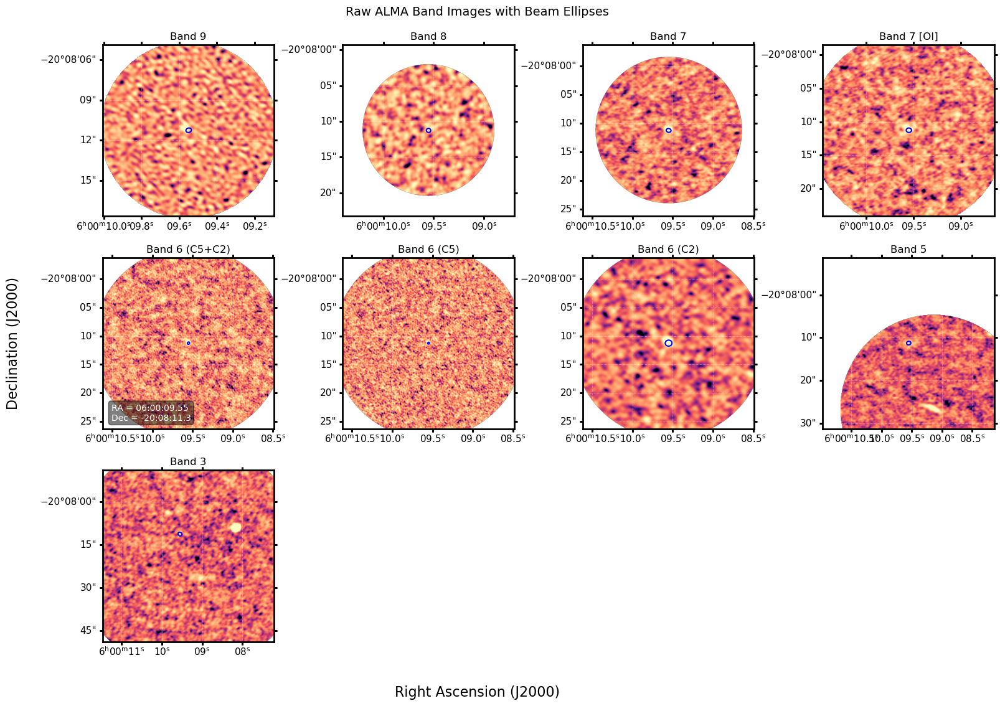

,Band,Flux Unit (BUNIT),RMS [Jy/beam],Pixel Scale (CDELT) [arcsec],Pixel Scale (WCS) [arcsec],Beam Major [arcsec],Beam Minor [arcsec],Beam PA [deg],Beam Area [arcsec²],Elongation (BMAJ/BMIN),FWHM [arcsec]
0,Band 9,Jy/beam,0.000120,0.05,0.05,0.446018,0.330442,77.726746,0.166998,1.349761,0.383905
1,Band 8,Jy/beam,0.000144,0.04,0.04,0.655053,0.575301,-82.480598,0.427008,1.138627,0.613883
2,Band 7,Jy/beam,0.000018,0.05,0.05,0.909668,0.662640,-82.720917,0.683007,1.372793,0.776391
3,Band 7 [OI],Jy/beam,0.000019,0.10,0.10,0.846194,0.670735,-88.652596,0.643110,1.261593,0.753374
4,Band 6 (C5+C2),Jy/beam,0.000009,0.05,0.05,0.439131,0.376136,47.671295,0.187156,1.167479,0.406414
5,Band 6 (C5),Jy/beam,0.000010,0.05,0.05,0.353702,0.293369,44.713215,0.117575,1.205655,0.322126
6,Band 6 (C2),Jy/beam,0.000017,0.05,0.05,1.264769,1.052974,87.874237,1.509014,1.201139,1.154023
7,Band 5,Jy/beam,0.000007,0.10,0.10,1.080147,0.830978,87.408432,1.017038,1.299850,0.947407
8,Band 3,Jy/beam,0.000003,0.10,0.10,1.553651,1.274067,-65.661804,2.242901,1.219442,1.406931


In [5]:
# --------------------------------------
# CELL 3: ALMA Raw Image Inspection & Beam Parameters
# --------------------------------------

from matplotlib.gridspec import GridSpec
from astropy.wcs.utils import proj_plane_pixel_scales, skycoord_to_pixel
import pandas as pd

# === Load ALMA raw images + WCS + beam info ===
alma_images, alma_wcs_list = [], []
alma_beam_major, alma_beam_minor, alma_beam_pa = [], [], []
alma_pixel_scales = []

for path in alma_fits_paths:
    try:
        with fits.open(path) as hdu:
            hdr = hdu[0].header
            img = hdu[0].data[0, 0, :, :]  # Assume 4D (Stokes/cube collapsed)
            wcs_full = WCS(hdr)
            pxscale = proj_plane_pixel_scales(wcs_full)[0] * 3600  # arcsec/pixel
            wcs = wcs_full.slice((0, 0))  # 2D WCS for image slice

            alma_images.append(img)
            alma_wcs_list.append(wcs)
            alma_beam_major.append(hdr.get('BMAJ', np.nan) * 3600)
            alma_beam_minor.append(hdr.get('BMIN', np.nan) * 3600)
            alma_beam_pa.append(hdr.get('BPA', np.nan))
            alma_pixel_scales.append(pxscale)
    except Exception as e:
        print(f"Skipped {path}: {e}")

# === Plot all raw ALMA bands ===
ncols = 4
nrows = int(np.ceil(len(alma_images) / ncols))
fig = plt.figure(figsize=(4.3 * ncols, 4.3 * nrows))
gs = GridSpec(nrows, ncols, figure=fig)

for i, (img, wcs, bmaj, bmin, bpa, pxscale, path) in enumerate(zip(
        alma_images, alma_wcs_list, alma_beam_major, alma_beam_minor, alma_beam_pa, alma_pixel_scales, alma_fits_paths)):

    ax = fig.add_subplot(gs[i], projection=wcs)

    # Normalize image stretch
    interval = PercentileInterval(99.5)
    vmin, vmax = interval.get_limits(img)
    norm = ImageNormalize(vmin=vmin, vmax=vmax, stretch=AsinhStretch())
    ax.imshow(img, origin='lower', cmap='magma', norm=norm)

    # Remove axis labels
    ax.coords[0].set_axislabel('')
    ax.coords[1].set_axislabel('')
    # Axis labels and ticks
    ax.coords[0].set_ticklabel(size=11)
    ax.coords[1].set_ticklabel(size=11)
    ax.coords.grid(True, color='white', ls='--', alpha=0.3)

    # Beam ellipse
    if not np.isnan(bmaj) and not np.isnan(bmin):
        ellipse = Ellipse(
            (coord.ra.deg, coord.dec.deg),
            width=bmin / 3600, height=bmaj / 3600,  # degrees
            angle=bpa,
            edgecolor='blue', facecolor='none',
            lw=1.5,
            transform=ax.get_transform('fk5')
        )
        ax.add_patch(ellipse)

    # RA/DEC display in central panel
    if i == len(alma_images) // 2:
        ra_str = coord.ra.to_string(unit=u.hour, sep=':', precision=2, pad=True)
        dec_str = coord.dec.to_string(unit=u.deg, sep=':', precision=1, pad=True, alwayssign=True)
        ax.text(0.05, 0.05, f"RA = {ra_str}\nDec = {dec_str}",
                transform=ax.transAxes,
                fontsize=10, color='white',
                bbox=dict(facecolor='black', alpha=0.5, boxstyle='round'))

    # Panel title
    ax.set_title(alma_band_names[i], fontsize=12)

# Global axis labels
fig.text(0.5, 0.06, 'Right Ascension (J2000)', ha='center', fontsize=16)
fig.text(0.06, 0.5, 'Declination (J2000)', va='center', rotation='vertical', fontsize=16)
fig.suptitle('Raw ALMA Band Images with Beam Ellipses', fontsize=14, y=0.92)
plt.tight_layout()
plt.subplots_adjust(wspace=0.4, hspace=0.15, left=0.15, bottom=0.12, top=0.88)
plt.show()

# === Generate Beam Table Summary ===
data = {
    "Band": [],
    "Flux Unit (BUNIT)": [],
    "RMS [Jy/beam]": [],
    "Pixel Scale (CDELT) [arcsec]": [],
    "Pixel Scale (WCS) [arcsec]": [],
    "Beam Major [arcsec]": [],
    "Beam Minor [arcsec]": [],
    "Beam PA [deg]": [],
    "Beam Area [arcsec²]": [],
    "Elongation (BMAJ/BMIN)": []
}

for i, path in enumerate(alma_fits_paths):
    with fits.open(path) as hdu:
        hdr = hdu[0].header
        img = hdu[0].data[0, 0]

        # Use precomputed RMS
        rms = alma_rms[i]


        # Pixel scales
        cdelt1 = np.abs(hdr.get("CDELT1", np.nan)) * 3600
        cdelt2 = np.abs(hdr.get("CDELT2", np.nan)) * 3600
        pixscale_cdelt = np.nanmean([cdelt1, cdelt2])

        wcs = WCS(hdr)
        pixscale_wcs = (
            np.abs(wcs.pixel_scale_matrix[0, 0]) * 3600
            if wcs.has_celestial
            else np.nan
        )

        # Beam
        bmaj = hdr.get("BMAJ", np.nan) * 3600
        bmin = hdr.get("BMIN", np.nan) * 3600
        bpa = hdr.get("BPA", np.nan)

        # Derived
        beam_area = np.pi * bmaj * bmin / (4.0 * np.log(2.0)) if np.all(np.isfinite([bmaj, bmin])) else np.nan
        elongation = bmaj / bmin if np.isfinite(bmaj) and np.isfinite(bmin) and bmin > 0 else np.nan
        bunit = hdr.get("BUNIT", "N/A")

        # Store
        data["Band"].append(alma_band_names[i])
        data["Flux Unit (BUNIT)"].append(bunit)
        data["RMS [Jy/beam]"].append(rms)
        data["Pixel Scale (CDELT) [arcsec]"].append(pixscale_cdelt)
        data["Pixel Scale (WCS) [arcsec]"].append(pixscale_wcs)
        data["Beam Major [arcsec]"].append(bmaj)
        data["Beam Minor [arcsec]"].append(bmin)
        data["Beam PA [deg]"].append(bpa)
        data["Beam Area [arcsec²]"].append(beam_area)
        data["Elongation (BMAJ/BMIN)"].append(elongation)

# Display table
beam_df = pd.DataFrame(data)
# Display table with added FWHM
beam_df["FWHM [arcsec]"] = np.sqrt(beam_df["Beam Major [arcsec]"] * beam_df["Beam Minor [arcsec]"])

display(beam_df)


# JWST

In [6]:
for name, img in zip(jwst_band_names, jwst_images):
    print(f"{name}: shape = {img.shape}, min = {np.nanmin(img):.2e}, max = {np.nanmax(img):.2e}")


f115w: shape = (20480, 20480), min = -3.87e-01, max = 3.32e+02
f150w: shape = (20480, 20480), min = -1.93e-01, max = 2.14e+02
f277w: shape = (10240, 10240), min = -3.22e-01, max = 2.13e+02
f356w: shape = (10240, 10240), min = -2.95e-01, max = 1.27e+02
f444w: shape = (10240, 10240), min = -8.48e-01, max = 1.55e+02


In [7]:
def plot_jwst_band(image, wcs, band_name):
    fig = plt.figure(figsize=(6, 6))
    ax = plt.subplot(projection=wcs)

    interval = PercentileInterval(99.5)
    vmin, vmax = interval.get_limits(image)
    norm = ImageNormalize(vmin=vmin, vmax=vmax, stretch=AsinhStretch())

    ax.imshow(image, origin='lower', cmap='plasma', norm=norm)
    ax.coords.grid(True, color='white', ls='--', alpha=0.5)
    ax.coords[0].set_axislabel('Right Ascension (J2000)', fontsize=12)
    ax.coords[1].set_axislabel('Declination (J2000)', fontsize=12)
    ax.set_title(f'JWST Raw Image: {band_name.upper()}', fontsize=14)

    plt.tight_layout()
    plt.show()


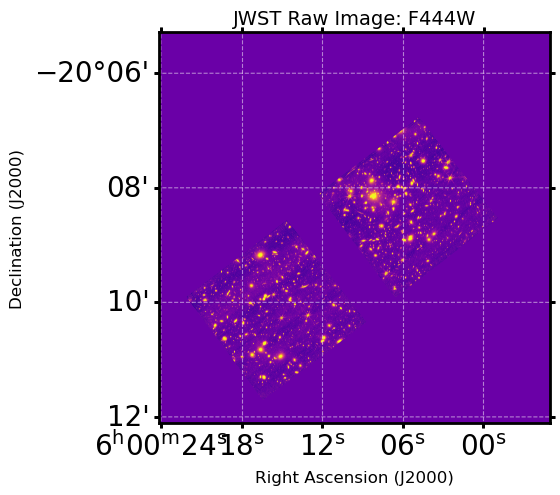

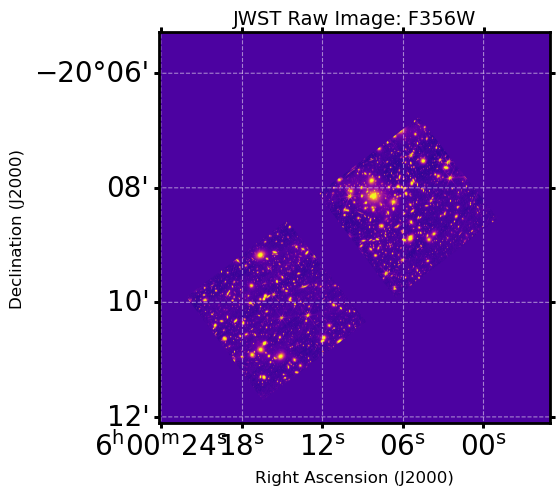

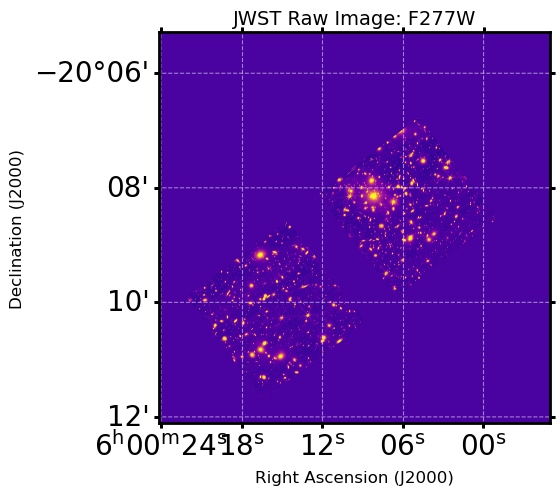

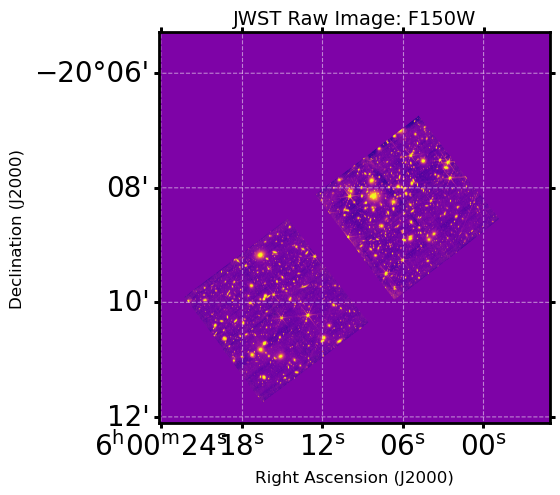

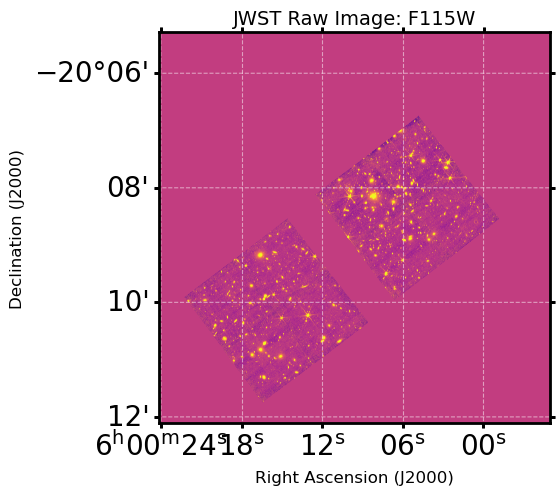

In [115]:
plot_jwst_band(jwst_images[4], jwst_wcs_list[4], jwst_band_names[4])  # F444W
plot_jwst_band(jwst_images[3], jwst_wcs_list[3], jwst_band_names[3])  # F356W
plot_jwst_band(jwst_images[2], jwst_wcs_list[2], jwst_band_names[2])  # F277W
plot_jwst_band(jwst_images[1], jwst_wcs_list[1], jwst_band_names[1])  # F150W
plot_jwst_band(jwst_images[0], jwst_wcs_list[0], jwst_band_names[0])  # F115W


In [8]:
# --------------------------------------
# CELL 4: JWST Header Summary Table
# --------------------------------------

from astropy.wcs.utils import proj_plane_pixel_scales
from astropy.stats import sigma_clipped_stats
import pandas as pd
import numpy as np
from astropy.wcs import WCS

jwst_table_data = {
    "Band": [],
    "Shape": [],
    "BUNIT": [],
    "Pixel Scale [arcsec/pixel]": [],
    "FILTER": [],
    "INSTRUME": [],
    "PHOTMJSR": [],
    "PHOTFLAM": [],
    "PHOTPLAM": [],
    "RMS [nJy/pixel]": []
}

for band, hdr, img in zip(jwst_band_names, jwst_headers, jwst_images):
    wcs = WCS(hdr)
    pixscale = proj_plane_pixel_scales(wcs)[0] * 3600  # arcsec/pixel

    _, _, rms_val = sigma_clipped_stats(img, sigma=3.0, maxiters=5)
    rms_njy = rms_val * 10  # BUNIT = 10 nJy → scale to nJy/pixel

    jwst_table_data["Band"].append(band.upper())
    jwst_table_data["Shape"].append(img.shape)
    jwst_table_data["BUNIT"].append(hdr.get("BUNIT", "—"))
    jwst_table_data["Pixel Scale [arcsec/pixel]"].append(round(pixscale, 3))
    jwst_table_data["FILTER"].append(hdr.get("FILTER", "—"))
    jwst_table_data["INSTRUME"].append(hdr.get("INSTRUME", "—"))
    jwst_table_data["PHOTMJSR"].append(hdr.get("PHOTMJSR", np.nan))
    jwst_table_data["PHOTFLAM"].append(hdr.get("PHOTFLAM", np.nan))
    jwst_table_data["PHOTPLAM"].append(hdr.get("PHOTPLAM", np.nan))
    jwst_table_data["RMS [nJy/pixel]"].append(round(rms_njy, 3))

df_jwst = pd.DataFrame(jwst_table_data)
display(df_jwst)


,Band,Shape,BUNIT,Pixel Scale [arcsec/pixel],FILTER,INSTRUME,PHOTMJSR,PHOTFLAM,PHOTPLAM,RMS [nJy/pixel]
0,F115W,"(20480, 20480)",10.0*nanoJansky,0.02,F115W,NIRCAM,2.9628,2.244053e-21,11543.009269,0.019
1,F150W,"(20480, 20480)",10.0*nanoJansky,0.02,F150W,NIRCAM,2.2512,1.327569e-21,15007.454908,0.012
2,F277W,"(10240, 10240)",10.0*nanoJansky,0.04,F277W,NIRCAM,0.4908,3.931397e-22,27577.958764,0.028
3,F356W,"(10240, 10240)",10.0*nanoJansky,0.04,F356W,NIRCAM,0.4047,2.348367e-22,35682.277638,0.020
4,F444W,"(10240, 10240)",10.0*nanoJansky,0.04,F444W,NIRCAM,0.3925,1.541848e-22,44036.710977,0.023


# Flux Calibration / Unit Normalization

In [9]:
# -----------------------------------------------
# Flux Calibration BEFORE Cutouts
# -----------------------------------------------

# ALMA: Jy/beam → Jy/pixel
pixscale = 0.04  # arcsec/pixel (JWST grid)

bmaj = np.array(alma_beam_major, dtype=float)  # arcsec
bmin = np.array(alma_beam_minor, dtype=float)  # arcsec

# Beam area in pixels
beam_area_pix = (np.pi / (4.0 * np.log(2.0))) * (bmaj * bmin) / (pixscale ** 2)
print("Beam area [pix]:", beam_area_pix)

# Flux-calibrated ALMA images
alma_fluxcalibrated = []
alma_variancecalibrated = []

for img, beam_area, rms in zip(alma_images, beam_area_pix, alma_rms):
    # Normalize flux
    flux = img / beam_area
    alma_fluxcalibrated.append(flux)

    # Flat variance map (scaled to Jy/pixel)
    var = (rms / beam_area)**2 * np.ones_like(img)
    alma_variancecalibrated.append(var)

# Summary prints
print("\nNormalized ALMA full images (pre-cutout):")
for name, flux_img, var_img in zip(alma_band_names, alma_fluxcalibrated, alma_variancecalibrated):
    print(f"{name:<18}: flux = [{np.nanmin(flux_img):.2e}, {np.nanmax(flux_img):.2e}], var = {np.nanmean(var_img):.2e} Jy/pix")


Beam area [pix]: [ 104.37396468  266.88019126  426.87909834  401.94379088  116.97222359
   73.48449163  943.13389104  635.64873672 1401.8133419 ]

Normalized ALMA full images (pre-cutout):
Band 9            : flux = [-5.38e-06, 5.30e-06], var = 1.31e-12 Jy/pix
Band 8            : flux = [-2.12e-06, 1.87e-06], var = 2.93e-13 Jy/pix
Band 7            : flux = [-1.70e-07, 4.67e-07], var = 1.85e-15 Jy/pix
Band 7 [OI]       : flux = [-1.86e-07, 3.71e-07], var = 2.26e-15 Jy/pix
Band 6 (C5+C2)    : flux = [-3.08e-07, 6.03e-07], var = 5.72e-15 Jy/pix
Band 6 (C5)       : flux = [-5.72e-07, 6.97e-07], var = 1.87e-14 Jy/pix
Band 6 (C2)       : flux = [-7.22e-08, 2.01e-07], var = 3.34e-16 Jy/pix
Band 5            : flux = [-4.74e-08, 9.32e-08], var = 1.13e-16 Jy/pix
Band 3            : flux = [-8.46e-09, 2.52e-07], var = 3.64e-18 Jy/pix


In [10]:
# JWST images already in units of 10 nJy / pixel → Convert to Jy / pixel
bunit_factor = 1e-8  # 10 nJy
jwst_fluxcalibrated = [img * bunit_factor for img in jwst_images]

# Optional sanity check
for name, img in zip(jwst_band_names, jwst_fluxcalibrated):
    print(f"{name}: min = {np.nanmin(img):.3e}, max = {np.nanmax(img):.3e} Jy/pix")


f115w: min = -3.867e-09, max = 3.321e-06 Jy/pix
f150w: min = -1.931e-09, max = 2.141e-06 Jy/pix
f277w: min = -3.220e-09, max = 2.132e-06 Jy/pix
f356w: min = -2.948e-09, max = 1.268e-06 Jy/pix
f444w: min = -8.477e-09, max = 1.554e-06 Jy/pix


# Extract cutouts and background subtraction(SEP)

JWST F115W: shape=(250, 250), RMS before=1.74e-10, after=1.70e-10
JWST F150W: shape=(250, 250), RMS before=8.92e-11, after=8.39e-11
JWST F277W: shape=(124, 124), RMS before=2.35e-10, after=2.19e-10
JWST F356W: shape=(124, 124), RMS before=1.90e-10, after=1.76e-10
JWST F444W: shape=(124, 124), RMS before=2.22e-10, after=2.13e-10
ALMA Band 9: shape=(98, 98), RMS before=1.19e-06, after=1.19e-06
ALMA Band 8: shape=(124, 124), RMS before=5.79e-07, after=5.64e-07
ALMA Band 7: shape=(98, 98), RMS before=4.53e-08, after=4.53e-08
ALMA Band 7 [OI]: shape=(50, 50), RMS before=5.80e-08, after=5.80e-08
ALMA Band 6 (C5+C2): shape=(98, 98), RMS before=7.49e-08, after=7.17e-08
ALMA Band 6 (C5): shape=(98, 98), RMS before=1.40e-07, after=1.39e-07
ALMA Band 6 (C2): shape=(98, 98), RMS before=1.98e-08, after=2.03e-08
ALMA Band 5: shape=(50, 50), RMS before=1.45e-08, after=1.45e-08
ALMA Band 3: shape=(48, 48), RMS before=2.15e-09, after=2.15e-09


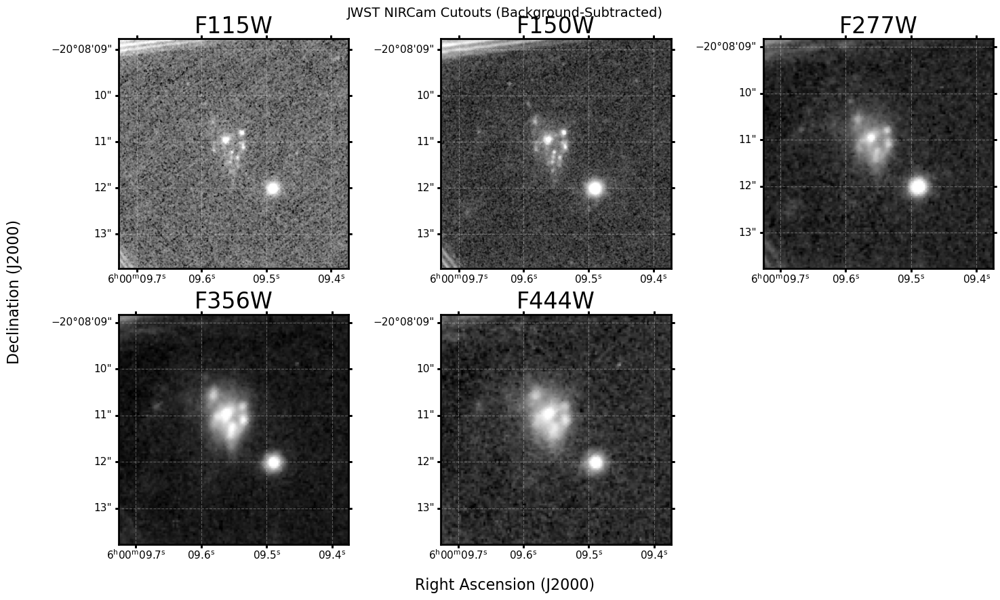

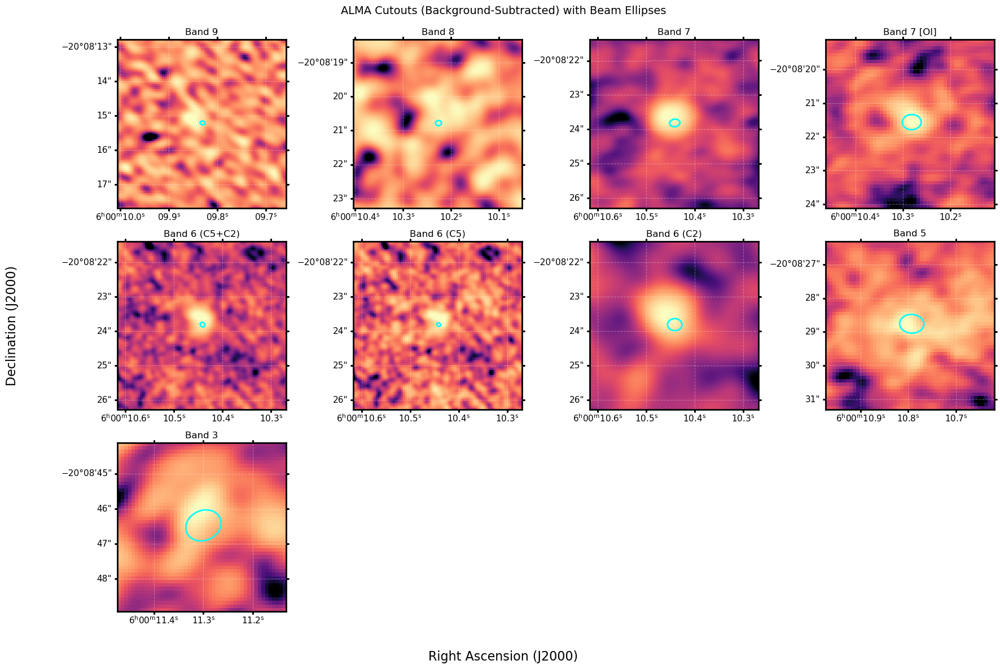

In [11]:
# --------------------------------------
# CELL 5: Cutouts and Background Subtraction (JWST + ALMA)
# --------------------------------------

# === JWST Cutouts ===
jwst_cutouts = []
jwst_cutouts_wcs = []
jwst_rms_before = []
jwst_rms_after = []

for band, hdr, img in zip(jwst_band_names, jwst_headers, jwst_fluxcalibrated):  # <-- normalized
    wcs_full = WCS(hdr)
    pix_scale = proj_plane_pixel_scales(wcs_full)[0] * 3600  # arcsec/pixel

    x0, y0 = skycoord_to_pixel(coord, wcs_full)
    x0, y0 = int(x0), int(y0)
    half = int((cutout_size_arcsec / 2) / pix_scale)
    x1, x2 = x0 - half, x0 + half
    y1, y2 = y0 - half, y0 + half

    cut = img[y1:y2, x1:x2].astype(np.float32)
    rms1 = sigma_clipped_stats(cut, sigma=3.0)[2]

    bkg = sep.Background(cut)
    cut_clean = cut - bkg.back()
    rms2 = sigma_clipped_stats(cut_clean, sigma=3.0)[2]

    jwst_cutouts.append(cut_clean)
    jwst_cutouts_wcs.append(wcs_full.slice((slice(y1, y2), slice(x1, x2))))
    jwst_rms_before.append(rms1)
    jwst_rms_after.append(rms2)

    print(f"JWST {band.upper()}: shape={cut.shape}, RMS before={rms1:.2e}, after={rms2:.2e}")

# === ALMA Cutouts ===
alma_cutouts = []
alma_cutouts_wcs = []
alma_variance_cutouts = []
alma_rms_before = []
alma_rms_after = []

for img, var, path, band in zip(alma_fluxcalibrated, alma_variancecalibrated, alma_fits_paths, alma_band_names):
    with fits.open(path) as hdu:
        hdr = hdu[0].header
        wcs_full = WCS(hdr)
        wcs_2d = wcs_full.slice((0, 0))
        pix_scale = proj_plane_pixel_scales(wcs_full)[0] * 3600  # arcsec/pixel

        x0, y0 = skycoord_to_pixel(coord, wcs_full)
        x0, y0 = int(x0), int(y0)
        half = int((cutout_size_arcsec / 2) / pix_scale)
        x1, x2 = x0 - half, x0 + half
        y1, y2 = y0 - half, y0 + half

        cut = img[y1:y2, x1:x2].astype(np.float32)
        rms1 = sigma_clipped_stats(cut, sigma=3.0)[2]

        bkg = sep.Background(cut)
        cut_clean = cut - bkg.back()
        rms2 = sigma_clipped_stats(cut_clean, sigma=3.0)[2]

        alma_cutouts.append(cut_clean)
        alma_cutouts_wcs.append(wcs_2d)
        alma_variance_cutouts.append(var[y1:y2, x1:x2])
        alma_rms_before.append(rms1)
        alma_rms_after.append(rms2)

        print(f"ALMA {band}: shape={cut.shape}, RMS before={rms1:.2e}, after={rms2:.2e}")
        
        
# === Plot JWST cutouts ===
ncols = 3
nrows = int(np.ceil(len(jwst_cutouts) / ncols))
fig = plt.figure(figsize=(5 * ncols, 5 * nrows))

for i, (cut, wcs, band) in enumerate(zip(jwst_cutouts, jwst_cutouts_wcs, jwst_band_names)):
    ax = fig.add_subplot(nrows, ncols, i + 1, projection=wcs)
    interval = PercentileInterval(99.5)
    vmin, vmax = interval.get_limits(cut)
    norm = ImageNormalize(vmin=vmin, vmax=vmax, stretch=AsinhStretch())
    ax.imshow(cut, origin='lower', cmap='gray', norm=norm)
    ax.set_title(band.upper())
    ax.coords[0].set_axislabel('')
    ax.coords[1].set_axislabel('')
    ax.coords[0].set_ticklabel(size=11)
    ax.coords[1].set_ticklabel(size=11)
    ax.coords.grid(True, color='white', ls='--', alpha=0.3)

fig.text(0.5, 0.06, 'Right Ascension (J2000)', ha='center', fontsize=16)
fig.text(0.01, 0.5, 'Declination (J2000)', va='center', rotation='vertical', fontsize=16)
fig.suptitle('JWST NIRCam Cutouts (Background-Subtracted)', fontsize=14, y=0.92)

plt.tight_layout()
plt.subplots_adjust(wspace=0.4, hspace=0.15, left=0.12, bottom=0.12, top=0.88)
plt.show()

# === Plot ALMA cutouts ===
ncols = 4
nrows = int(np.ceil(len(alma_cutouts) / ncols))
fig = plt.figure(figsize=(4.5 * ncols, 4.5 * nrows))
gs = GridSpec(nrows, ncols, figure=fig)

for i, (img, wcs, bmaj, bmin, bpa, pxscale, band) in enumerate(zip(
    alma_cutouts, alma_cutouts_wcs, alma_beam_major, alma_beam_minor, alma_beam_pa, alma_pixel_scale, alma_band_names)):

    ax = fig.add_subplot(gs[i], projection=wcs)
    interval = PercentileInterval(99.5)
    vmin, vmax = interval.get_limits(img)
    norm = ImageNormalize(vmin=vmin, vmax=vmax, stretch=AsinhStretch())
    ax.imshow(img, origin='lower', cmap='magma', norm=norm)

    # Beam ellipse
    if not np.isnan(bmaj) and not np.isnan(bmin):
        ny, nx = img.shape
        ellipse = Ellipse(
            (nx / 2, ny / 2),
            width=bmin / pxscale, height=bmaj / pxscale,
            angle=bpa,
            edgecolor='cyan', facecolor='none', lw=2.0,
            transform=ax.get_transform('pixel')
        )
        ax.add_patch(ellipse)

    ax.set_title(band, fontsize=12)
    ax.coords[0].set_axislabel('')
    ax.coords[1].set_axislabel('')
    ax.coords[0].set_ticklabel(size=11)
    ax.coords[1].set_ticklabel(size=11)
    ax.coords.grid(True, color='white', ls='--', alpha=0.3)

fig.text(0.5, 0.06, 'Right Ascension (J2000)', ha='center', fontsize=16)
fig.text(0.01, 0.5, 'Declination (J2000)', va='center', rotation='vertical', fontsize=16)
fig.suptitle('ALMA Cutouts (Background-Subtracted) with Beam Ellipses', fontsize=14, y=0.92)

plt.tight_layout()
plt.subplots_adjust(wspace=0.4, hspace=0.15, left=0.12, bottom=0.12, top=0.88)
plt.show()



In [12]:
# --------------------------------------
# CELL 6: JWST Variance Maps for Photometry
# --------------------------------------

"""
This cell defines the JWST noise model used for photometry.
We adopt a single, global RMS per band (measured from full-frame data),
convert it to Jy/pixel, and construct flat variance maps on the
background-subtracted JWST cutouts.

This mirrors the ALMA variance handling and ensures unit consistency
for SEP photometry.
"""

# Global JWST RMS values from header / full-frame statistics (nJy/pixel)
# Use the values reported in the JWST header summary table (CELL 4)
jwst_rms_njy = {
    "f115w": 1.9,
    "f150w": 1.2,
    "f277w": 2.8,
    "f356w": 2.0,
    "f444w": 2.3,
}

# Build variance cutouts (Jy^2 / pixel^2)
jwst_variance_cutouts = []

for band, cut in zip(jwst_band_names, jwst_cutouts):
    rms_jy = jwst_rms_njy[band] * 1e-9  # nJy → Jy
    var = rms_jy**2 * np.ones_like(cut)
    jwst_variance_cutouts.append(var)

# Sanity check: print RMS in Jy/pixel for each band
print("JWST RMS used for photometry (Jy/pixel):")
for band, var in zip(jwst_band_names, jwst_variance_cutouts):
    print(f"  {band.upper():5s}: {np.sqrt(np.nanmean(var)):.2e}")


JWST RMS used for photometry (Jy/pixel):
  F115W: 1.90e-09
  F150W: 1.20e-09
  F277W: 2.80e-09
  F356W: 2.00e-09
  F444W: 2.30e-09


# WCS Alignment and Reprojection

📐 Reference (F444W): shape=(124, 124), pixel scale ≈ 0.040"/px

--- JWST Resampling to F444W Grid ---
F115W : (250, 250) → (124, 124)
F150W : (250, 250) → (124, 124)
F277W : already (124, 124)
F356W : already (124, 124)
F444W : already (124, 124)

--- ALMA Resampling to JWST Grid ---
Band 9            : (99, 99) → (124, 124)
Band 8            : (124, 124) → (124, 124)
Band 7            : (99, 99) → (124, 124)
Band 7 [OI]       : (49, 49) → (124, 124)
Band 6 (C5+C2)    : (99, 99) → (124, 124)
Band 6 (C5)       : (99, 99) → (124, 124)
Band 6 (C2)       : (99, 99) → (124, 124)
Band 5            : (49, 49) → (124, 124)
Band 3            : (49, 49) → (124, 124)


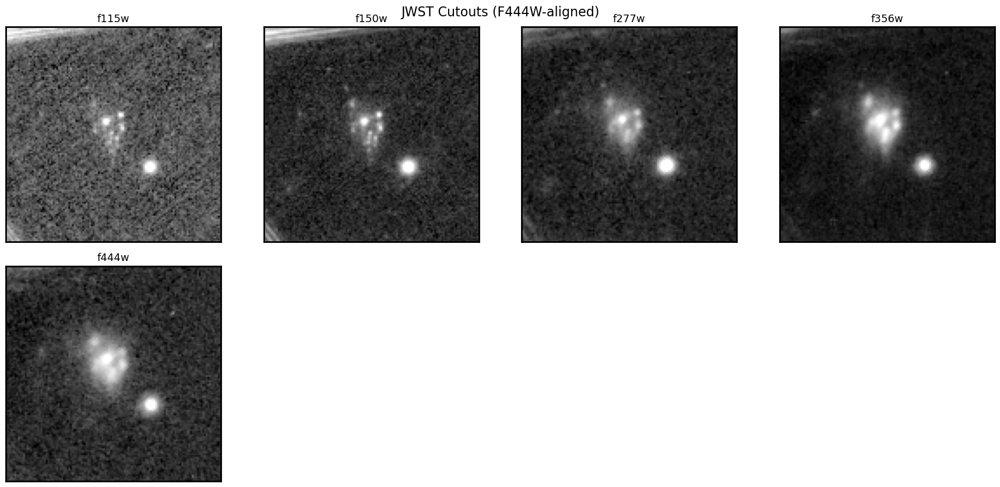

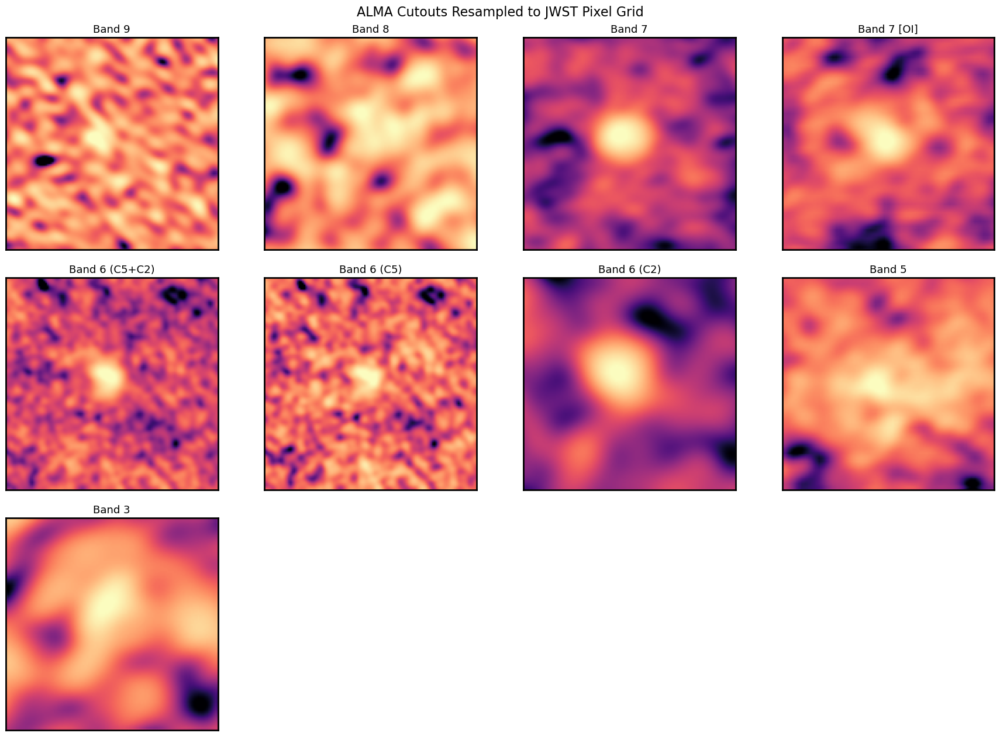

In [13]:
# --------------------------------------
# CELL: Pixel-Aligned JWST & ALMA Cutouts (No WCS)
# --------------------------------------

from skimage.transform import resize
from astropy.nddata import Cutout2D
from matplotlib.gridspec import GridSpec

# ======================================================
# JWST reference (F444W)
# ======================================================
ref_index = jwst_band_names.index("f444w")
ref_data = jwst_cutouts[ref_index]
ref_shape = ref_data.shape
ref_wcs = jwst_cutouts_wcs[ref_index]
ref_pixscale = proj_plane_pixel_scales(ref_wcs)[0] * 3600  # arcsec/pix

print(f"📐 Reference (F444W): shape={ref_shape}, pixel scale ≈ {ref_pixscale:.3f}\"/px")

# ======================================================
# JWST: resample ALL cutouts to F444W reference grid
# ======================================================
jwst_cutouts_resampled = []
jwst_variance_resampled = []

print("\n--- JWST Resampling to F444W Grid ---")
for img, var, band in zip(jwst_cutouts, jwst_variance_cutouts, jwst_band_names):

    if img.shape != ref_shape:
        img_rs = resize(img, ref_shape, order=1, preserve_range=True)
        var_rs = resize(var, ref_shape, order=1, preserve_range=True)
        print(f"{band.upper():<6}: {img.shape} → {ref_shape}")
    else:
        img_rs = img
        var_rs = var
        print(f"{band.upper():<6}: already {ref_shape}")

    jwst_cutouts_resampled.append(img_rs)
    jwst_variance_resampled.append(var_rs)

# Overwrite to keep pipeline consistent
jwst_cutouts = jwst_cutouts_resampled
jwst_variance_cutouts = jwst_variance_resampled

# ======================================================
# ALMA: rescaling to match JWST grid (flux + variance)
# ======================================================
alma_resampled = []
alma_variance_resampled = []

print("\n--- ALMA Resampling to JWST Grid ---")
for flux_img, var_img, path, band in zip(
        alma_fluxcalibrated,
        alma_variancecalibrated,
        alma_fits_paths,
        alma_band_names):

    try:
        with fits.open(path) as hdu:
            hdr = hdu[0].header
            wcs = WCS(hdr).celestial
            pixscale = proj_plane_pixel_scales(wcs)[0] * 3600  # arcsec/pixel

            # Cutout size in native ALMA pixels
            cutout_size_px = int(ref_shape[0] * ref_pixscale / pixscale)

            # Cut flux + variance
            cut_flux = Cutout2D(
                flux_img, position=coord,
                size=cutout_size_px, wcs=wcs
            ).data

            cut_var = Cutout2D(
                var_img, position=coord,
                size=cutout_size_px, wcs=wcs
            ).data

            # Resize both to JWST grid
            flux_rs = resize(cut_flux, ref_shape, order=1, preserve_range=True)
            var_rs  = resize(cut_var,  ref_shape, order=1, preserve_range=True)

            alma_resampled.append(flux_rs)
            alma_variance_resampled.append(var_rs)

            print(f"{band:<18}: {cut_flux.shape} → {ref_shape}")

    except Exception as e:
        print(f"⚠️ {band}: failed → {e}")
        alma_resampled.append(np.full(ref_shape, np.nan))
        alma_variance_resampled.append(np.full(ref_shape, np.nan))

# ======================================================
# Plotting utilities
# ======================================================
def plot_cutout_grid(cutouts, labels, title, cmap='magma'):
    n = len(cutouts)
    ncols = 4
    nrows = int(np.ceil(n / ncols))
    fig = plt.figure(figsize=(4.5 * ncols, 4.5 * nrows))
    gs = GridSpec(nrows, ncols, figure=fig)

    for i, (img, label) in enumerate(zip(cutouts, labels)):
        if np.isnan(img).all():
            continue
        ax = fig.add_subplot(gs[i])
        interval = PercentileInterval(99.5)
        vmin, vmax = interval.get_limits(img[~np.isnan(img)])
        norm = ImageNormalize(vmin=vmin, vmax=vmax, stretch=AsinhStretch())
        ax.imshow(img, origin='lower', cmap=cmap, norm=norm)
        ax.set_title(label, fontsize=13)
        ax.set_xticks([])
        ax.set_yticks([])

    fig.suptitle(title, fontsize=16, y=0.94)
    plt.tight_layout()
    plt.subplots_adjust(top=0.90)
    plt.show()

# ======================================================
# Final plots
# ======================================================
plot_cutout_grid(
    jwst_cutouts,
    jwst_band_names,
    "JWST Cutouts (F444W-aligned)",
    cmap="gray"
)

plot_cutout_grid(
    alma_resampled,
    alma_band_names,
    "ALMA Cutouts Resampled to JWST Pixel Grid",
    cmap="magma"
)


In [14]:
# Check shape and NaN status of all aligned cutouts

print("\n--- JWST Aligned Cutouts ---")
for name, img in zip(jwst_band_names, jwst_cutouts_resampled):
    print(f"{name.upper():<6}: shape = {img.shape}, all-NaN = {np.isnan(img).all()}")

print("\n--- ALMA Resampled Cutouts ---")
for name, img in zip(alma_band_names, alma_resampled):
    print(f"{name:<18}: shape = {img.shape}, all-NaN = {np.isnan(img).all()}")



--- JWST Aligned Cutouts ---
F115W : shape = (124, 124), all-NaN = False
F150W : shape = (124, 124), all-NaN = False
F277W : shape = (124, 124), all-NaN = False
F356W : shape = (124, 124), all-NaN = False
F444W : shape = (124, 124), all-NaN = False

--- ALMA Resampled Cutouts ---
Band 9            : shape = (124, 124), all-NaN = False
Band 8            : shape = (124, 124), all-NaN = False
Band 7            : shape = (124, 124), all-NaN = False
Band 7 [OI]       : shape = (124, 124), all-NaN = False
Band 6 (C5+C2)    : shape = (124, 124), all-NaN = False
Band 6 (C5)       : shape = (124, 124), all-NaN = False
Band 6 (C2)       : shape = (124, 124), all-NaN = False
Band 5            : shape = (124, 124), all-NaN = False
Band 3            : shape = (124, 124), all-NaN = False


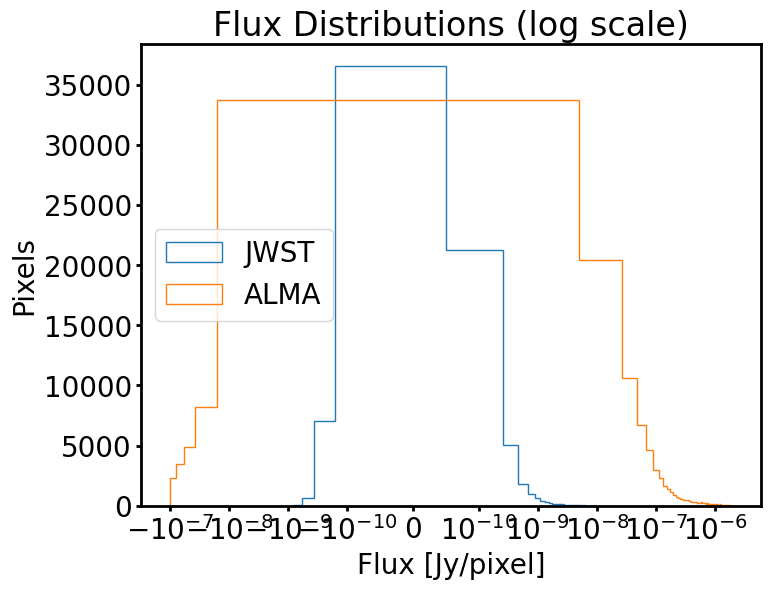

In [15]:
import matplotlib.pyplot as plt

# Flatten non-NaN pixels
jwst_fluxes = np.hstack([img[~np.isnan(img)] for img in jwst_cutouts_resampled])
alma_fluxes = np.hstack([img[~np.isnan(img)] for img in alma_resampled])

plt.hist(jwst_fluxes, bins=100, range=(-1e-9, 2e-8), histtype='step', label='JWST')
plt.hist(alma_fluxes, bins=100, range=(-1e-7, 2e-6), histtype='step', label='ALMA')
plt.xscale('symlog', linthresh=1e-10)
plt.xlabel('Flux [Jy/pixel]')
plt.ylabel('Pixels')
plt.legend()
plt.title('Flux Distributions (log scale)')
plt.show()


# PSF Matching

## To Band 3

📌 Worst PSF (σ) = 14.94 pixels → FWHM = 1.407″


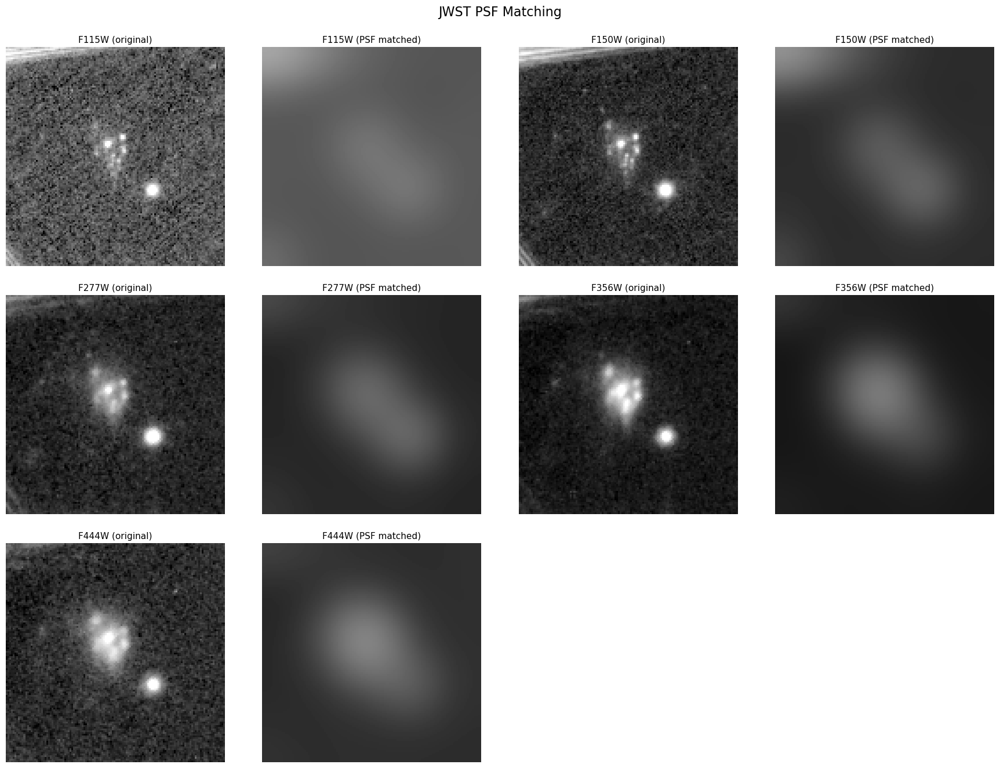

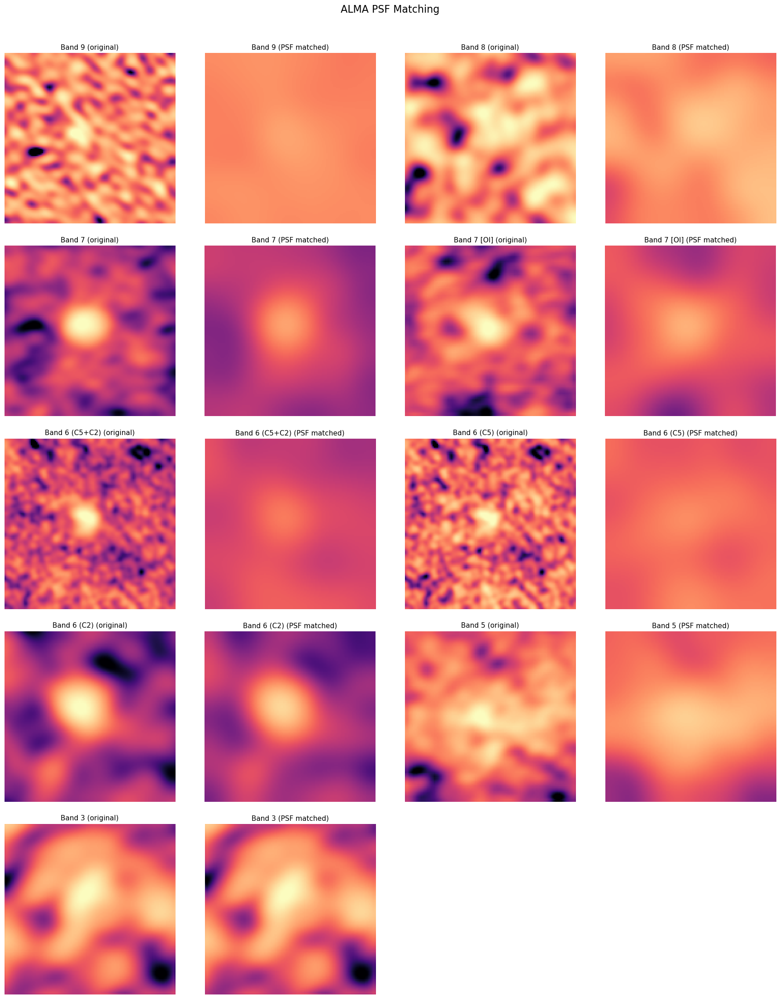


✅ PSF matching completed → All bands now match worst resolution: FWHM ≈ 1.407″


In [16]:
# -----------------------------------------------
# CELL: PSF Matching (JWST + ALMA, Aligned Cutouts)
# -----------------------------------------------

from scipy.ndimage import gaussian_filter
from astropy.visualization import ImageNormalize, AsinhStretch, PercentileInterval
from matplotlib.gridspec import GridSpec

# --- Updated FWHM estimates in arcsec ---
jwst_fwhm_arcsec = [0.07, 0.09, 0.11, 0.13, 0.15]  # F115W to F444W (in order of jwst_band_names)
alma_fwhm_arcsec = np.sqrt(np.array(alma_beam_major) * np.array(alma_beam_minor))  # ALMA: geometric mean

# JWST pixel scale
pixscale = ref_pixscale  # ≈ 0.04 arcsec/pixel (from F444W)

# Convert FWHM → σ (in pixels)
fwhm_all = jwst_fwhm_arcsec + list(alma_fwhm_arcsec)
sigma_pix = [fwhm / (2.3548 * pixscale) for fwhm in fwhm_all]
worst_sigma = max(sigma_pix)  # PSF matching target
print(f"📌 Worst PSF (σ) = {worst_sigma:.2f} pixels → FWHM = {worst_sigma * 2.3548 * pixscale:.3f}″")

# --- PSF Matching Function ---
def match_psf(cutouts, input_sigmas, target_sigma):
    matched = []
    for img, sigma in zip(cutouts, input_sigmas):
        if target_sigma <= sigma:
            matched.append(img.copy())  # already worse or equal
        else:
            kernel_sigma = np.sqrt(target_sigma**2 - sigma**2)
            matched.append(gaussian_filter(img, sigma=kernel_sigma))
    return matched

# Apply to JWST & ALMA aligned/resampled cutouts
jwst_matched = match_psf(jwst_cutouts_resampled, sigma_pix[:5], worst_sigma)
alma_matched = match_psf(alma_resampled, sigma_pix[5:], worst_sigma)

# --- Plotting Function ---
def plot_matched_cutouts(before, after, labels, title, cmap='magma'):
    n = len(labels)
    ncols = 4
    nrows = int(np.ceil(n / ncols))
    fig = plt.figure(figsize=(4.5 * ncols, 9 * nrows))
    gs = GridSpec(nrows * 2, ncols, figure=fig)

    for i, (b_img, a_img, name) in enumerate(zip(before, after, labels)):
        interval = PercentileInterval(99.5)
        norm = ImageNormalize(vmin=interval.get_limits(b_img)[0],
                              vmax=interval.get_limits(b_img)[1],
                              stretch=AsinhStretch())

        ax1 = fig.add_subplot(gs[2*i])
        ax1.imshow(b_img, origin='lower', cmap=cmap, norm=norm)
        ax1.set_title(f"{name} (original)", fontsize=11)
        ax1.axis('off')

        ax2 = fig.add_subplot(gs[2*i+1])
        ax2.imshow(a_img, origin='lower', cmap=cmap, norm=norm)
        ax2.set_title(f"{name} (PSF matched)", fontsize=11)
        ax2.axis('off')

    fig.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.94)
    plt.show()

# --- Final Plots ---
plot_matched_cutouts(jwst_cutouts_resampled, jwst_matched, [b.upper() for b in jwst_band_names], "JWST PSF Matching", cmap="gray")
plot_matched_cutouts(alma_resampled, alma_matched, alma_band_names, "ALMA PSF Matching", cmap="magma")

print(f"\n✅ PSF matching completed → All bands now match worst resolution: FWHM ≈ {worst_sigma * 2.3548 * pixscale:.3f}″")


## To Band 6(C2)

📌 Worst resolution (target σ): 12.25 px → FWHM ≈ 1.154″


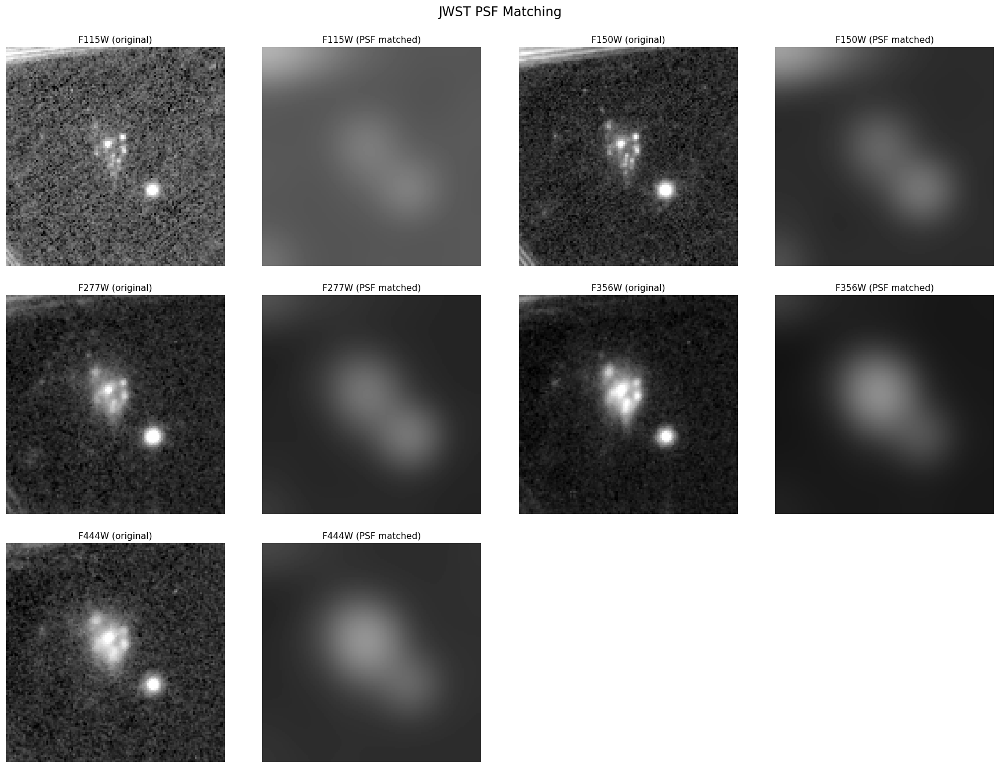

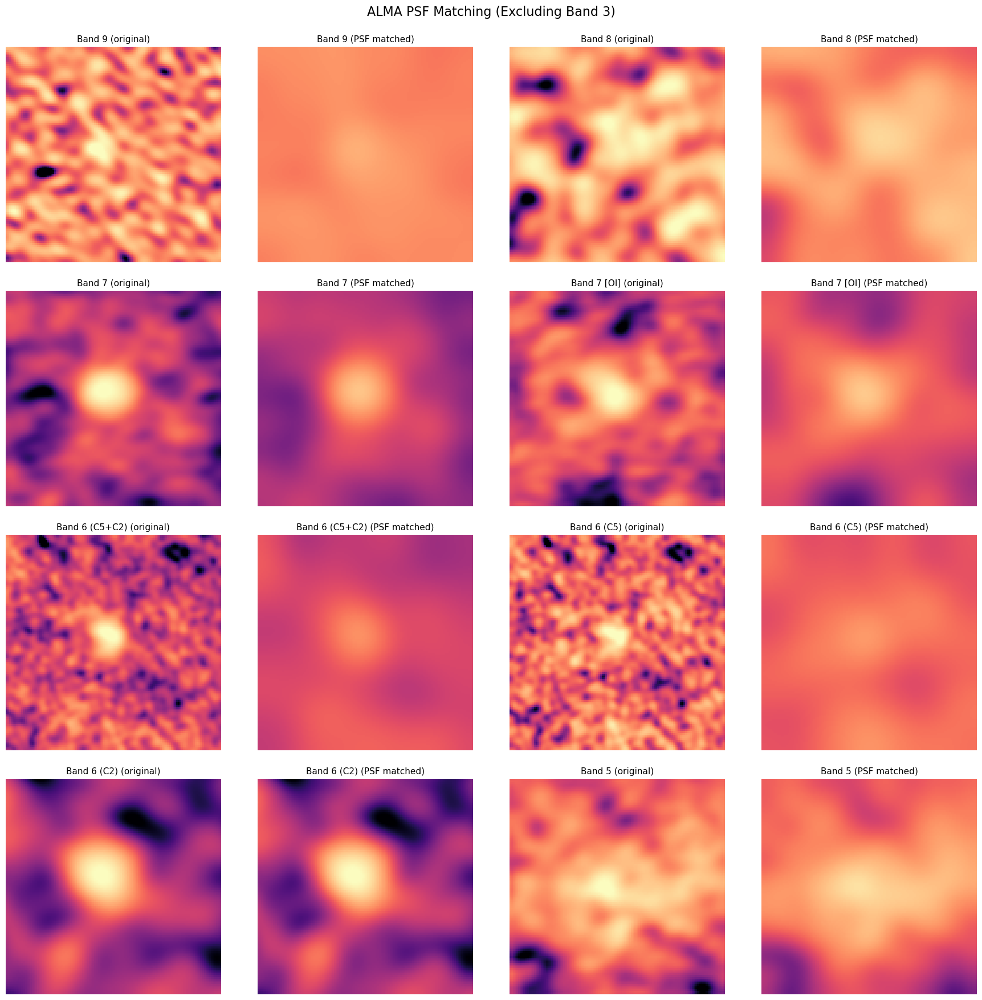

✅ PSF matching done (to FWHM ≈ 1.154")


In [17]:
# -----------------------------------------------
# CELL: PSF Matching (JWST + ALMA) [Excluding Band 3]
# -----------------------------------------------

from scipy.ndimage import gaussian_filter
from astropy.visualization import ImageNormalize, AsinhStretch, PercentileInterval
from matplotlib.gridspec import GridSpec

# --- Drop Band 3 (worst resolution) ---
alma_band_names_psf         = alma_band_names[:-1]
alma_resampled_psf          = alma_resampled[:-1]
alma_variance_resampled_psf = alma_variance_resampled[:-1]
alma_beam_major_psf         = alma_beam_major[:-1]
alma_beam_minor_psf         = alma_beam_minor[:-1]

# --- FWHM in arcsec ---
jwst_fwhm_arcsec = [0.07, 0.09, 0.11, 0.13, 0.15]  # From F115W to F444W
alma_fwhm_arcsec = np.sqrt(np.array(alma_beam_major_psf) * np.array(alma_beam_minor_psf))

# --- Convert to sigma in pixels ---
pixscale = 0.04  # arcsec/pixel (JWST grid)
fwhm_all = jwst_fwhm_arcsec + list(alma_fwhm_arcsec)
sigma_pix = [f / (2.3548 * pixscale) for f in fwhm_all]
worst_sigma = max(sigma_pix)

print(f"📌 Worst resolution (target σ): {worst_sigma:.2f} px → FWHM ≈ {worst_sigma * 2.3548 * pixscale:.3f}″")

# --- PSF Matching Function ---
def match_psf(cutouts, input_sigmas, target_sigma):
    matched = []
    for img, sigma in zip(cutouts, input_sigmas):
        if target_sigma <= sigma:
            matched.append(img.copy())
        else:
            kernel_sigma = np.sqrt(target_sigma**2 - sigma**2)
            matched.append(gaussian_filter(img, sigma=kernel_sigma))
    return matched

# --- Apply to JWST and ALMA ---
jwst_matched = match_psf(jwst_cutouts_resampled, sigma_pix[:5], worst_sigma)
alma_matched = match_psf(alma_resampled_psf, sigma_pix[5:], worst_sigma)

# --- Plot Function ---
def plot_matched_cutouts(before, after, labels, title, cmap='magma'):
    n = len(labels)
    ncols = 4
    nrows = int(np.ceil(n / ncols))

    fig = plt.figure(figsize=(4.5 * ncols, 9 * nrows))
    gs = GridSpec(nrows * 2, ncols, figure=fig)

    for i, (b_img, a_img, name) in enumerate(zip(before, after, labels)):
        interval = PercentileInterval(99.5)
        norm = ImageNormalize(vmin=interval.get_limits(b_img)[0], 
                              vmax=interval.get_limits(b_img)[1], 
                              stretch=AsinhStretch())

        ax1 = fig.add_subplot(gs[2*i])
        ax1.imshow(b_img, origin='lower', cmap=cmap, norm=norm)
        ax1.set_title(f"{name} (original)", fontsize=11)
        ax1.axis('off')

        ax2 = fig.add_subplot(gs[2*i+1])
        ax2.imshow(a_img, origin='lower', cmap=cmap, norm=norm)
        ax2.set_title(f"{name} (PSF matched)", fontsize=11)
        ax2.axis('off')

    fig.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.94)
    plt.show()

# --- Plot Results ---
plot_matched_cutouts(jwst_cutouts_resampled, jwst_matched,
                     [b.upper() for b in jwst_band_names],
                     "JWST PSF Matching", cmap="gray")

plot_matched_cutouts(alma_resampled_psf, alma_matched,
                     alma_band_names_psf,
                     "ALMA PSF Matching (Excluding Band 3)", cmap="magma")

print(f"✅ PSF matching done (to FWHM ≈ {worst_sigma * 2.3548 * pixscale:.3f}\")")


## To Band 7

🎯 Target PSF: FWHM ≈ 0.776" (Band 7)
✅ PSF matching completed for flux and variance


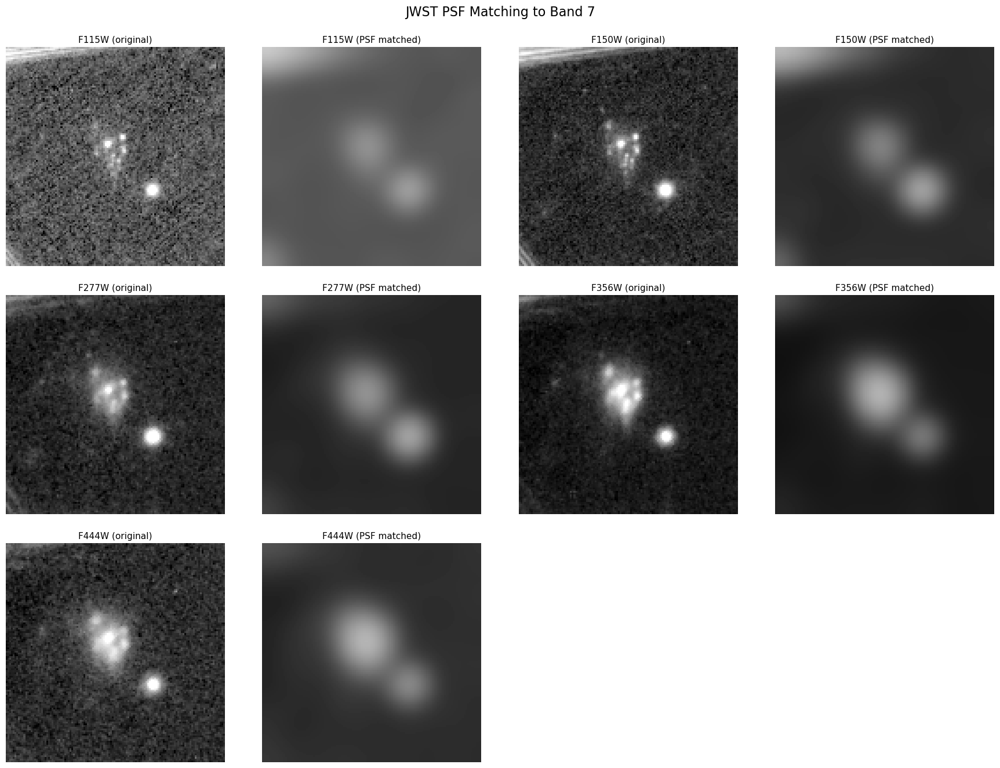

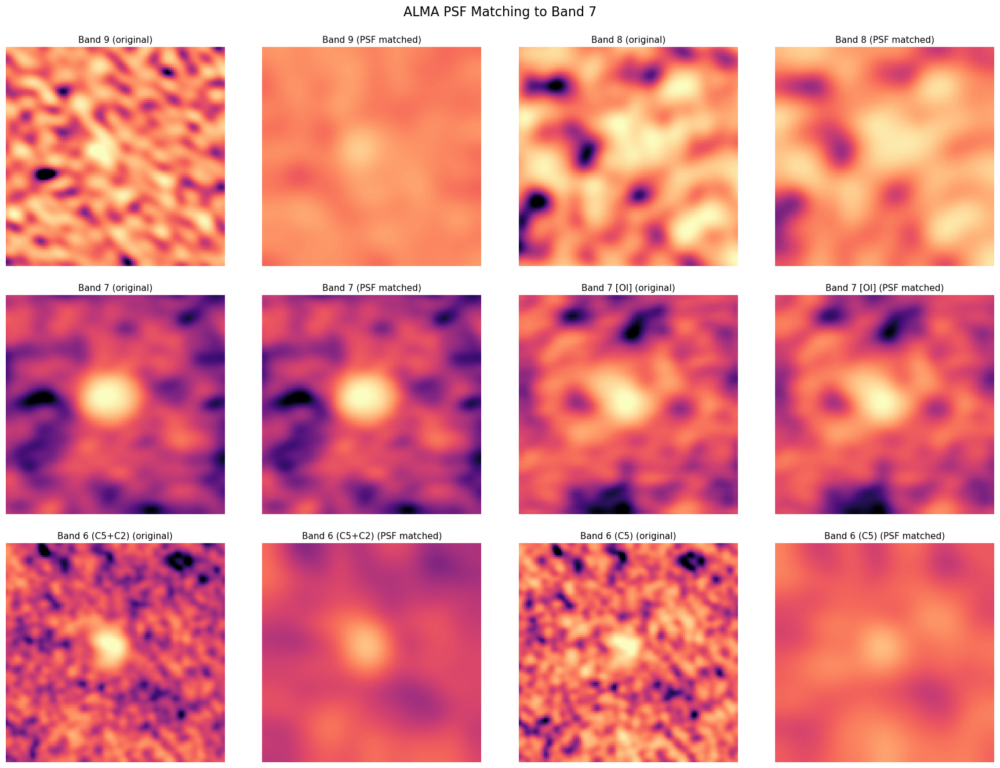


JWST RMS after PSF matching:
F115W: 1.90e-09 Jy/pix
F150W: 1.20e-09 Jy/pix
F277W: 2.80e-09 Jy/pix
F356W: 2.00e-09 Jy/pix
F444W: 2.30e-09 Jy/pix


In [18]:
# -----------------------------------------------
# CELL 3.1: Definitive PSF Matching to Band 7
#           (Flux + Variance + Diagnostic Plots)
# -----------------------------------------------

from scipy.ndimage import gaussian_filter
from astropy.visualization import ImageNormalize, AsinhStretch, PercentileInterval
from matplotlib.gridspec import GridSpec

# ======================================================
# PSF FWHM values (arcsec)
# ======================================================

# JWST NIRCam PSF FWHM (ordered as jwst_band_names)
jwst_fwhm_arcsec = [0.07, 0.09, 0.11, 0.13, 0.15]  # F115W → F444W

# ALMA PSF FWHM (geometric mean, excluding Band 3 & 5 by design)
alma_fwhm_arcsec = [0.384, 0.614, 0.776, 0.753, 0.406, 0.322]
alma_band_names_matched = [
    'Band 9', 'Band 8', 'Band 7', 'Band 7 [OI]',
    'Band 6 (C5+C2)', 'Band 6 (C5)'
]

# ======================================================
# Convert FWHM → σ (pixels)
# ======================================================

pixscale = ref_pixscale  # JWST grid (arcsec/pixel)

jwst_sigma_pix = [f / (2.3548 * pixscale) for f in jwst_fwhm_arcsec]
alma_sigma_pix = [f / (2.3548 * pixscale) for f in alma_fwhm_arcsec]

# Target PSF = Band 7
target_sigma = max(alma_sigma_pix)

print(f"🎯 Target PSF: FWHM ≈ {target_sigma * 2.3548 * pixscale:.3f}\" (Band 7)")

# ======================================================
# PSF Matching Functions
# ======================================================

def match_psf_flux(images, input_sigmas, target_sigma):
    matched = []
    for img, sigma in zip(images, input_sigmas):
        if sigma >= target_sigma:
            matched.append(img.copy())
        else:
            kernel_sigma = np.sqrt(target_sigma**2 - sigma**2)
            matched.append(gaussian_filter(img, sigma=kernel_sigma))
    return matched


def match_psf_variance(variances, input_sigmas, target_sigma):
    matched = []
    for var, sigma in zip(variances, input_sigmas):
        if sigma >= target_sigma:
            matched.append(var.copy())
        else:
            kernel_sigma = np.sqrt(target_sigma**2 - sigma**2)
            matched.append(gaussian_filter(var, sigma=kernel_sigma))
    return matched

# ======================================================
# Apply PSF Matching
# ======================================================

jwst_flux_matched = match_psf_flux(
    jwst_cutouts, jwst_sigma_pix, target_sigma
)

jwst_variance_matched = match_psf_variance(
    jwst_variance_cutouts, jwst_sigma_pix, target_sigma
)

alma_flux_matched = match_psf_flux(
    alma_resampled, alma_sigma_pix, target_sigma
)

alma_variance_matched = match_psf_variance(
    alma_variance_resampled, alma_sigma_pix, target_sigma
)

print("✅ PSF matching completed for flux and variance")

# ======================================================
# Plotting: BEFORE vs AFTER (your original style)
# ======================================================

def plot_psf_comparison(before, after, labels, title, cmap):
    n = len(labels)
    ncols = 4
    nrows = int(np.ceil(n / ncols))

    fig = plt.figure(figsize=(4.5 * ncols, 9 * nrows))
    gs = GridSpec(nrows * 2, ncols, figure=fig)

    for i, (b_img, a_img, name) in enumerate(zip(before, after, labels)):
        interval = PercentileInterval(99.5)
        vmin, vmax = interval.get_limits(b_img[~np.isnan(b_img)])
        norm = ImageNormalize(vmin=vmin, vmax=vmax, stretch=AsinhStretch())

        ax1 = fig.add_subplot(gs[2*i])
        ax1.imshow(b_img, origin='lower', cmap=cmap, norm=norm)
        ax1.set_title(f"{name} (original)", fontsize=11)
        ax1.axis('off')

        ax2 = fig.add_subplot(gs[2*i + 1])
        ax2.imshow(a_img, origin='lower', cmap=cmap, norm=norm)
        ax2.set_title(f"{name} (PSF matched)", fontsize=11)
        ax2.axis('off')

    fig.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.94)
    plt.show()

# --- JWST ---
plot_psf_comparison(
    jwst_cutouts,
    jwst_flux_matched,
    [b.upper() for b in jwst_band_names],
    "JWST PSF Matching to Band 7",
    cmap="gray"
)

# --- ALMA ---
plot_psf_comparison(
    alma_resampled,
    alma_flux_matched,
    alma_band_names_matched,
    "ALMA PSF Matching to Band 7",
    cmap="magma"
)

# ======================================================
# RMS sanity check (post-PSF)
# ======================================================

print("\nJWST RMS after PSF matching:")
for band, var in zip(jwst_band_names, jwst_variance_matched):
    print(f"{band.upper():5s}: {np.sqrt(np.nanmean(var)):.2e} Jy/pix")


# Source detection

🔍 Detected 1 sources in F444W (3σ threshold)


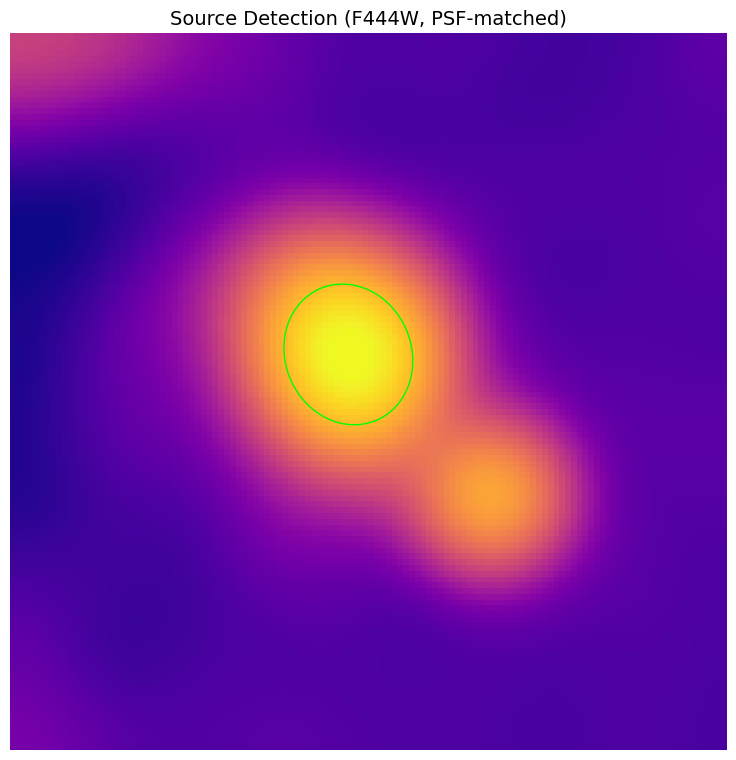

In [19]:
# -----------------------------------------------
# CELL: Source Detection on F444W (PSF-matched)
# -----------------------------------------------

import sep
from astropy.visualization import ImageNormalize, AsinhStretch, PercentileInterval
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse

# ======================================================
# Detection image and variance (FINAL products)
# ======================================================

f444w_index = jwst_band_names.index("f444w")

detection_image = jwst_flux_matched[f444w_index]
detection_variance = jwst_variance_matched[f444w_index]
detection_err = np.sqrt(detection_variance)

# ======================================================
# Background estimation (on flux image)
# ======================================================

bkg = sep.Background(detection_image)
data_sub = detection_image - bkg.back()

# ======================================================
# Source extraction
# ======================================================

sources = sep.extract(
    data_sub,
    thresh=3.0,           # 3σ detection
    err=detection_err
)

print(f"🔍 Detected {len(sources)} sources in F444W (3σ threshold)")

# ======================================================
# Plot detection result
# ======================================================

fig, ax = plt.subplots(figsize=(8, 8))
interval = PercentileInterval(99.5)
norm = ImageNormalize(data_sub, stretch=AsinhStretch(), interval=interval)
ax.imshow(data_sub, cmap='plasma', origin='lower', norm=norm)

for src in sources:
    e = Ellipse(
        xy=(src['x'], src['y']),
        width=6 * src['a'],
        height=6 * src['b'],
        angle=src['theta'] * 180. / np.pi,
        edgecolor='lime',
        facecolor='none',
        lw=1
    )
    ax.add_patch(e)

ax.set_title("Source Detection (F444W, PSF-matched)", fontsize=14)
plt.axis('off')
plt.tight_layout()
plt.show()


In [20]:
# -----------------------------------------------
# CELL: Source Detection (All Bands, SEP-based, No Plot)
# -----------------------------------------------

import sep
import numpy as np

def sep_detect_all_bands(
    flux_images,
    variance_images,
    band_names,
    label="Set",
    sigma_thresh=2.0,
    minarea=5
):
    """
    SEP-based detection on background-subtracted images using propagated variance.
    Returns a list of source catalogs (structured arrays) per band.
    """

    print(f"\n--- Source Detection (SEP): {label} ---")
    catalogs = []

    for img, var, name in zip(flux_images, variance_images, band_names):

        if img is None or np.isnan(img).all():
            print(f"{name:<15}: Skipped (empty or NaN)")
            catalogs.append(None)
            continue

        # Background estimate (robust to residual large-scale structure)
        bkg = sep.Background(img)
        data_sub = img - bkg.back()

        # Use full propagated error map (best practice)
        err = np.sqrt(var)

        # Source extraction
        cat = sep.extract(
            data_sub,
            thresh=sigma_thresh,
            err=err,
            minarea=minarea
        )

        print(f"{name:<15}: Detected {len(cat):2d} sources (thresh={sigma_thresh:.1f}σ, minarea={minarea})")
        catalogs.append(cat)

    return catalogs


# Run detections on FINAL PSF-matched products (Band 7 PSF)
jwst_catalogs_b7 = sep_detect_all_bands(
    jwst_flux_matched,
    jwst_variance_matched,
    jwst_band_names,
    label="JWST (→ Band 7)",
    sigma_thresh=3.0,
    minarea=20
)

alma_catalogs_b7 = sep_detect_all_bands(
    alma_flux_matched,
    alma_variance_matched,
    alma_band_names_matched,
    label="ALMA (→ Band 7)",
    sigma_thresh=3.0,
    minarea=5
)



--- Source Detection (SEP): JWST (→ Band 7) ---
f115w          : Detected  0 sources (thresh=3.0σ, minarea=20)
f150w          : Detected  0 sources (thresh=3.0σ, minarea=20)
f277w          : Detected  0 sources (thresh=3.0σ, minarea=20)
f356w          : Detected  1 sources (thresh=3.0σ, minarea=20)
f444w          : Detected  1 sources (thresh=3.0σ, minarea=20)

--- Source Detection (SEP): ALMA (→ Band 7) ---
Band 9         : Detected  1 sources (thresh=3.0σ, minarea=5)
Band 8         : Detected  1 sources (thresh=3.0σ, minarea=5)
Band 7         : Detected  1 sources (thresh=3.0σ, minarea=5)
Band 7 [OI]    : Detected  1 sources (thresh=3.0σ, minarea=5)
Band 6 (C5+C2) : Detected  1 sources (thresh=3.0σ, minarea=5)
Band 6 (C5)    : Detected  1 sources (thresh=3.0σ, minarea=5)


# Segmentation and Deblending

🔍 SEP detected 1 source(s) in F444W at 2.0σ
Source A: x=58.02, y=68.03, a=6.57, b=5.74, flux=1.29e-06 Jy
ℹ️ Only one statistically separable source detected.
   Clumpy morphology will be treated as a single system.


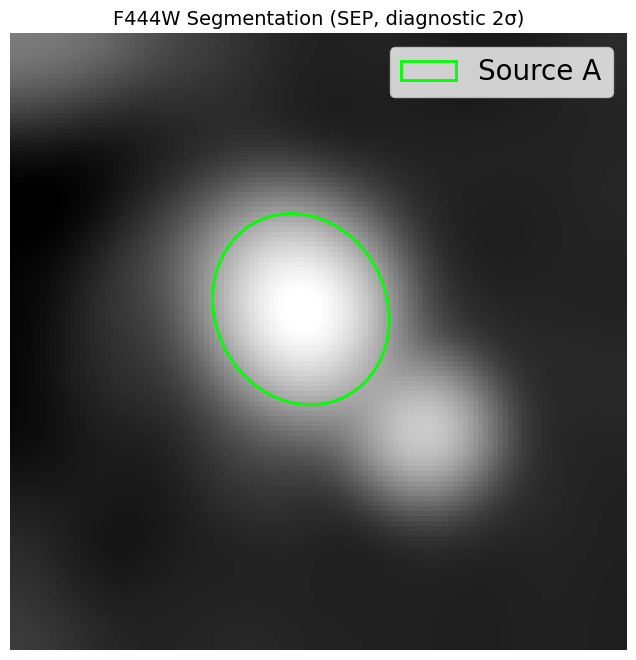

In [21]:
# -----------------------------------------------
# CELL: JWST Segmentation & Geometry (Diagnostic)
#       SEP-based, F444W, PSF → Band 7
# -----------------------------------------------

import numpy as np
import sep
from matplotlib.patches import Ellipse
import matplotlib.pyplot as plt
from astropy.visualization import ImageNormalize, AsinhStretch, PercentileInterval

# ======================================================
# Select F444W final products
# ======================================================

f444w_index = jwst_band_names.index("f444w")
img = jwst_flux_matched[f444w_index]
var = jwst_variance_matched[f444w_index]
err = np.sqrt(var)

# ======================================================
# Background subtraction
# ======================================================

bkg = sep.Background(img)
data_sub = img - bkg.back()

# ======================================================
# SEP detection (diagnostic deblending test)
# ======================================================

sigma_thresh = 2.0   # permissive but physically meaningful
minarea = 5

catalog = sep.extract(
    data_sub,
    thresh=sigma_thresh,
    err=err,
    minarea=minarea
)

n_src = len(catalog)
print(f"🔍 SEP detected {n_src} source(s) in F444W at {sigma_thresh:.1f}σ")

# Sort by flux (brightest first)
if n_src > 0:
    order = np.argsort(catalog['flux'])[::-1]
    catalog = catalog[order]

# ======================================================
# Store results in a flexible structure
# ======================================================

jwst_sources = {}

for i, src in enumerate(catalog):
    label = chr(ord("A") + i)
    jwst_sources[label] = src

    print(
        f"Source {label}: "
        f"x={src['x']:.2f}, y={src['y']:.2f}, "
        f"a={src['a']:.2f}, b={src['b']:.2f}, "
        f"flux={src['flux']:.2e} Jy"
    )

if n_src == 1:
    print("ℹ️ Only one statistically separable source detected.")
    print("   Clumpy morphology will be treated as a single system.")

# ======================================================
# Diagnostic plot
# ======================================================

fig, ax = plt.subplots(figsize=(7, 7))
interval = PercentileInterval(99.5)
norm = ImageNormalize(data_sub, stretch=AsinhStretch(), interval=interval)

ax.imshow(data_sub, origin='lower', cmap='gray', norm=norm)

colors = ["lime", "cyan", "magenta", "yellow"]

for (label, src), color in zip(jwst_sources.items(), colors):
    e = Ellipse(
        xy=(src['x'], src['y']),
        width=6 * src['a'],
        height=6 * src['b'],
        angle=np.degrees(src['theta']),
        edgecolor=color,
        facecolor='none',
        lw=2,
        label=f"Source {label}"
    )
    ax.add_patch(e)

ax.legend()
ax.set_title("F444W Segmentation (SEP, diagnostic 2σ)", fontsize=14)
ax.axis('off')
plt.tight_layout()
plt.show()


✅ SEP detected 2 sources in F444W at 0.4σ

Source A (brighter):
  x=58.02, y=67.81, flux=2.59e-06 Jy

Source B (fainter):
  x=81.89, y=44.17, flux=6.09e-07 Jy


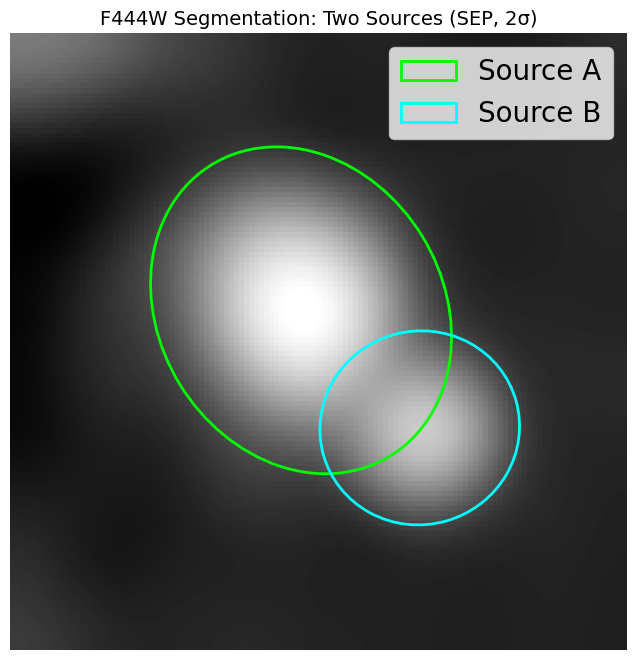

In [22]:
# -----------------------------------------------
# CELL: JWST Segmentation & Geometry (Two Sources)
#       SEP-based, F444W, PSF → Band 7
# -----------------------------------------------

import numpy as np
import sep
from matplotlib.patches import Ellipse
import matplotlib.pyplot as plt
from astropy.visualization import ImageNormalize, AsinhStretch, PercentileInterval

# ======================================================
# Select F444W final products
# ======================================================

f444w_index = jwst_band_names.index("f444w")
img = jwst_flux_matched[f444w_index]
var = jwst_variance_matched[f444w_index]
err = np.sqrt(var)

# ======================================================
# Background subtraction
# ======================================================

bkg = sep.Background(img)
data_sub = img - bkg.back()

# ======================================================
# SEP detection (PERMISSIVE, for components)
# ======================================================

sigma_thresh = 0.4     # intentionally lower to split components
minarea = 10

catalog = sep.extract(
    data_sub,
    thresh=sigma_thresh,
    err=err,
    minarea=minarea
)

if len(catalog) < 2:
    raise RuntimeError(
        "❌ Fewer than two sources detected at 2σ.\n"
        "If you believe there are two galaxies, increase minarea or inspect manually."
    )

print(f"✅ SEP detected {len(catalog)} sources in F444W at {sigma_thresh}σ")

# ======================================================
# Sort sources by flux (brightest first)
# ======================================================

order = np.argsort(catalog['flux'])[::-1]
catalog = catalog[order]

src_A = catalog[0]
src_B = catalog[1]

print("\nSource A (brighter):")
print(f"  x={src_A['x']:.2f}, y={src_A['y']:.2f}, flux={src_A['flux']:.2e} Jy")

print("\nSource B (fainter):")
print(f"  x={src_B['x']:.2f}, y={src_B['y']:.2f}, flux={src_B['flux']:.2e} Jy")

# ======================================================
# Store geometries
# ======================================================

jwst_sources = {
    "A": src_A,
    "B": src_B
}

# ======================================================
# Diagnostic plot
# ======================================================

fig, ax = plt.subplots(figsize=(7, 7))
interval = PercentileInterval(99.5)
norm = ImageNormalize(data_sub, stretch=AsinhStretch(), interval=interval)

ax.imshow(data_sub, origin='lower', cmap='gray', norm=norm)

for label, src, color in zip(["A", "B"], [src_A, src_B], ["lime", "cyan"]):
    e = Ellipse(
        xy=(src['x'], src['y']),
        width=6 * src['a'],
        height=6 * src['b'],
        angle=np.degrees(src['theta']),
        edgecolor=color,
        facecolor='none',
        lw=2,
        label=f"Source {label}"
    )
    ax.add_patch(e)

ax.legend()
ax.set_title("F444W Segmentation: Two Sources (SEP, 2σ)", fontsize=14)
ax.axis('off')
plt.tight_layout()
plt.show()


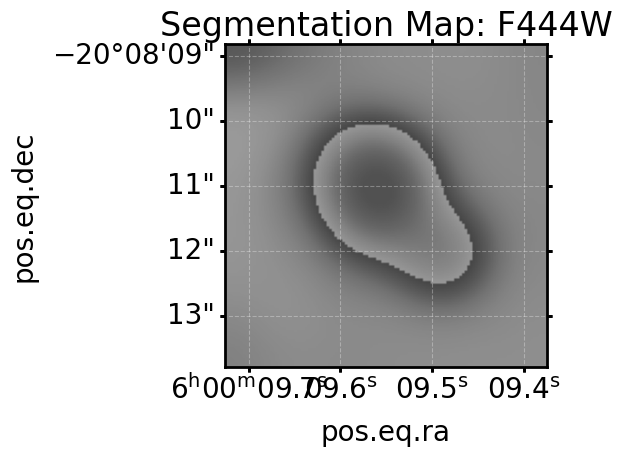

📦 1 deblended sources:
Available columns: ['label', 'xcentroid', 'ycentroid', 'sky_centroid', 'bbox_xmin', 'bbox_xmax', 'bbox_ymin', 'bbox_ymax', 'area', 'semimajor_sigma', 'semiminor_sigma', 'orientation', 'eccentricity', 'min_value', 'max_value', 'local_background', 'segment_flux', 'segment_fluxerr', 'kron_flux', 'kron_fluxerr']
 - Label 1: Centroid=(61.9, 63.6)


In [23]:
# -----------------------------------------------------------
# CELL: Diagnostic Segmentation & Deblending for JWST Band
# -----------------------------------------------------------
from astropy.stats import sigma_clipped_stats
from astropy.convolution import Gaussian2DKernel, convolve
from photutils.segmentation import detect_sources, deblend_sources, SourceCatalog
from astropy.visualization import ImageNormalize, PercentileInterval, AsinhStretch
import matplotlib.pyplot as plt
import numpy as np

# --- Parameters ---
sigma_thresh = 5.0
npixels = 3
kernel_fwhm = 1.6
contrast = 1e-19
nlevels = 1024

# --- Choose JWST band for segmentation test ---
band_index = jwst_band_names.index("f444w")  # You can try "f277w" or "f356w" here too
img = jwst_matched[band_index]
band_label = jwst_band_names[band_index].upper()

# --- Detection image prep ---
mean, median, std = sigma_clipped_stats(img, sigma=3.0, mask=np.isnan(img))
threshold = median + sigma_thresh * std
kernel = Gaussian2DKernel(x_stddev=kernel_fwhm)
kernel.normalize()
img_smooth = convolve(img, kernel, normalize_kernel=True)

# --- Segmentation & Deblending ---
segm = detect_sources(img_smooth, threshold=threshold, npixels=npixels, mask=np.isnan(img))
if segm is not None:
    segm_deblended = deblend_sources(img_smooth, segm, npixels=npixels, 
                                     nlevels=nlevels, contrast=contrast, progress_bar=False)
else:
    print("⚠️ No sources detected.")
    segm_deblended = None

# --- Plot segmentation map ---
fig, ax = plt.subplots(1, 1, figsize=(6, 6), subplot_kw={'projection': ref_wcs})
norm = ImageNormalize(vmin=np.nanpercentile(img, 0.5), vmax=np.nanpercentile(img, 99.5), stretch=AsinhStretch())
ax.imshow(img, origin='lower', cmap='Greys', norm=norm)
if segm_deblended:
    ax.imshow(segm_deblended.data, origin='lower', cmap='nipy_spectral', alpha=0.4)
ax.set_title(f"Segmentation Map: {band_label}")
ax.coords.grid(color='white', alpha=0.3, ls='--')
plt.tight_layout()
plt.show()

# --- Source catalog summary ---
if segm_deblended:
    catalog = SourceCatalog(data=img, segment_img=segm_deblended)
    table = catalog.to_table()

    print(f"📦 {len(table)} deblended sources:")
    print("Available columns:", table.colnames)

    for row in table:
        label = row['label']
        x = row['xcentroid']
        y = row['ycentroid']
        print(f" - Label {label}: Centroid=({x:.1f}, {y:.1f})")
else:
    print("🚫 No segmentation available.")



# Free Photometry

In [24]:
# ----------------------------------------------------------
# CELL: Empirical ALMA Noise (Reference Aperture)
# ----------------------------------------------------------

import numpy as np
import sep

n_random = 300
edge_margin = 15
rng = np.random.default_rng(42)

# Reference circular aperture (pixels)
r_emp_pix = 5.0

alma_sigma_emp_ref = {}

print("\n--- Empirical ALMA Noise (reference aperture) ---")

for img, band in zip(alma_flux_matched, alma_band_names_matched):

    img = img.astype(np.float32)
    mask = np.isnan(img)

    bkg = sep.Background(img, mask=mask)
    img_sub = img - bkg.back()

    ny, nx = img.shape
    fluxes = []

    for _ in range(n_random):
        x = rng.uniform(edge_margin, nx - edge_margin)
        y = rng.uniform(edge_margin, ny - edge_margin)

        f, _, _ = sep.sum_circle(
            img_sub,
            np.array([x]), np.array([y]),
            r_emp_pix,
            mask=mask,
            subpix=5
        )
        fluxes.append(float(f[0]))

    sigma_emp = np.nanstd(fluxes)
    alma_sigma_emp_ref[band] = sigma_emp

    print(f"{band:<15}: σ_emp(ref) = {sigma_emp:.3e} Jy")

print("✅ ALMA empirical noise reference computed")



--- Empirical ALMA Noise (reference aperture) ---
Band 9         : σ_emp(ref) = 3.366e-05 Jy
Band 8         : σ_emp(ref) = 3.076e-05 Jy
Band 7         : σ_emp(ref) = 7.776e-06 Jy
Band 7 [OI]    : σ_emp(ref) = 6.073e-06 Jy
Band 6 (C5+C2) : σ_emp(ref) = 4.483e-06 Jy
Band 6 (C5)    : σ_emp(ref) = 5.274e-06 Jy
✅ ALMA empirical noise reference computed


In [25]:
# ----------------------------------------------------------
# CELL: Exploratory Free Photometry (Per-Band)
# ----------------------------------------------------------

import numpy as np
import sep

sigma_thresh = 2.0
minarea = 5
subpix = 5

r_scale = np.linspace(0.3, 15.0, 50)
px_scale = ref_pixscale

def free_photometry(img, var, band, is_alma=False):
    img = img.astype(np.float32)
    mask = np.isnan(img)

    bkg = sep.Background(img, mask=mask)
    img_sub = img - bkg.back()

    objects = sep.extract(
        img_sub,
        thresh=sigma_thresh,
        err=np.sqrt(var),
        minarea=minarea
    )

    if len(objects) == 0:
        print(f"[{band}] ❌ no detection")
        return None

    obj = objects[np.argmax(objects["flux"])]
    x0, y0 = obj["x"], obj["y"]
    a, b, th = obj["a"], obj["b"], obj["theta"]

    flux, snr = [], []

    # Reference empirical noise (ALMA)
    if is_alma:
        sigma_ref = alma_sigma_emp_ref[band]
        A_ref = np.pi * r_emp_pix**2

    r_arcsec = r_scale * np.sqrt(a * b) * px_scale

    for s in r_scale:
        f, e, _ = sep.sum_ellipse(
            img_sub,
            np.array([x0]), np.array([y0]),
            np.array([a * s]), np.array([b * s]),
            np.array([th]),
            err=np.sqrt(var),
            subpix=subpix
        )

        f = float(f[0])
        e = float(e[0])

        if is_alma:
            A = np.pi * (a * s) * (b * s)
            sigma = sigma_ref * np.sqrt(A / A_ref)
            snr.append(f / sigma if sigma > 0 else np.nan)
        else:
            snr.append(f / e if e > 0 else np.nan)

        flux.append(f)

    return {
        "geom": (x0, y0, a, b, th),
        "flux": np.array(flux),
        "snr": np.array(snr),
        "r_arcsec": r_arcsec
    }


# --------------------------
# Run free photometry
# --------------------------

jwst_free, alma_free = {}, {}

for img, var, band in zip(jwst_flux_matched, jwst_variance_matched, jwst_band_names):
    res = free_photometry(img, var, band.upper(), is_alma=False)
    if res:
        jwst_free[band.upper()] = res

for img, var, band in zip(alma_flux_matched, alma_variance_matched, alma_band_names_matched):
    res = free_photometry(img, var, band, is_alma=True)
    if res:
        alma_free[band] = res

print("✅ Free photometry completed")


[F115W] ❌ no detection
✅ Free photometry completed


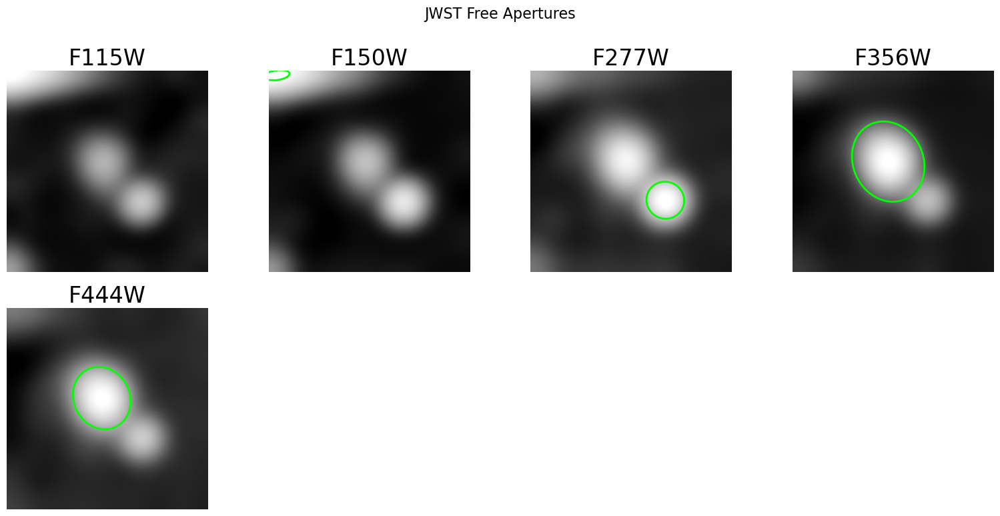

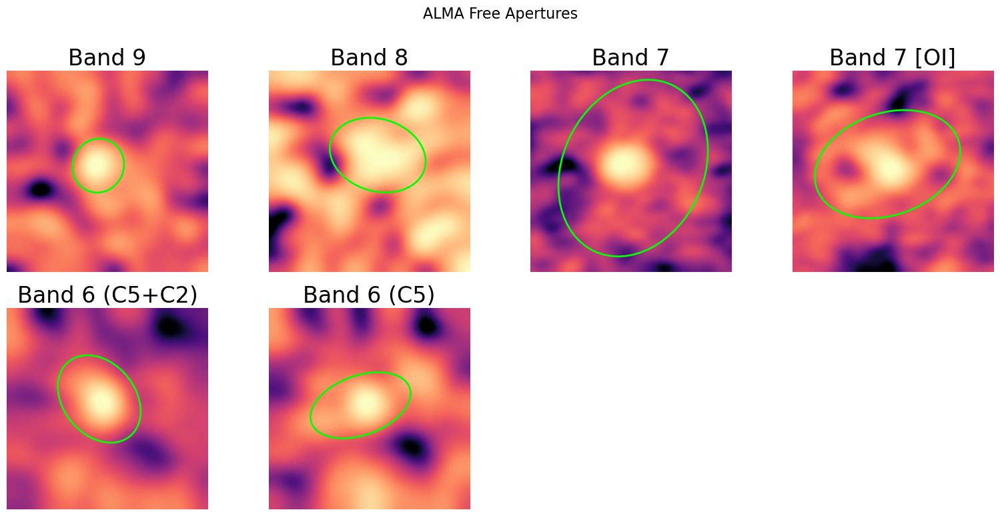

In [26]:
# ----------------------------------------------------------
# CELL: Aperture Overlay (All Bands)
# ----------------------------------------------------------

import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
from astropy.visualization import ImageNormalize, AsinhStretch, PercentileInterval
from matplotlib import gridspec
import numpy as np

def plot_apertures(images, labels, results, title, cmap):
    n = len(images)
    ncols = 4
    nrows = int(np.ceil(n / ncols))

    fig = plt.figure(figsize=(4*ncols, 4*nrows))
    gs = gridspec.GridSpec(nrows, ncols)

    for i, (img, lab) in enumerate(zip(images, labels)):
        ax = fig.add_subplot(gs[i])

        interval = PercentileInterval(99.5)
        vmin, vmax = interval.get_limits(img[np.isfinite(img)])
        norm = ImageNormalize(vmin=vmin, vmax=vmax, stretch=AsinhStretch())

        ax.imshow(img, origin="lower", cmap=cmap, norm=norm)
        ax.set_title(lab)
        ax.axis("off")

        if lab in results:
            x0, y0, a, b, th = results[lab]["geom"]
            ell = Ellipse(
                (x0, y0), 6*a, 6*b,
                angle=np.degrees(th),
                edgecolor="lime", facecolor="none", lw=2
            )
            ax.add_patch(ell)

    fig.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()


plot_apertures(
    jwst_flux_matched,
    [b.upper() for b in jwst_band_names],
    jwst_free,
    "JWST Free Apertures",
    cmap="gray"
)

plot_apertures(
    alma_flux_matched,
    alma_band_names_matched,
    alma_free,
    "ALMA Free Apertures",
    cmap="magma"
)


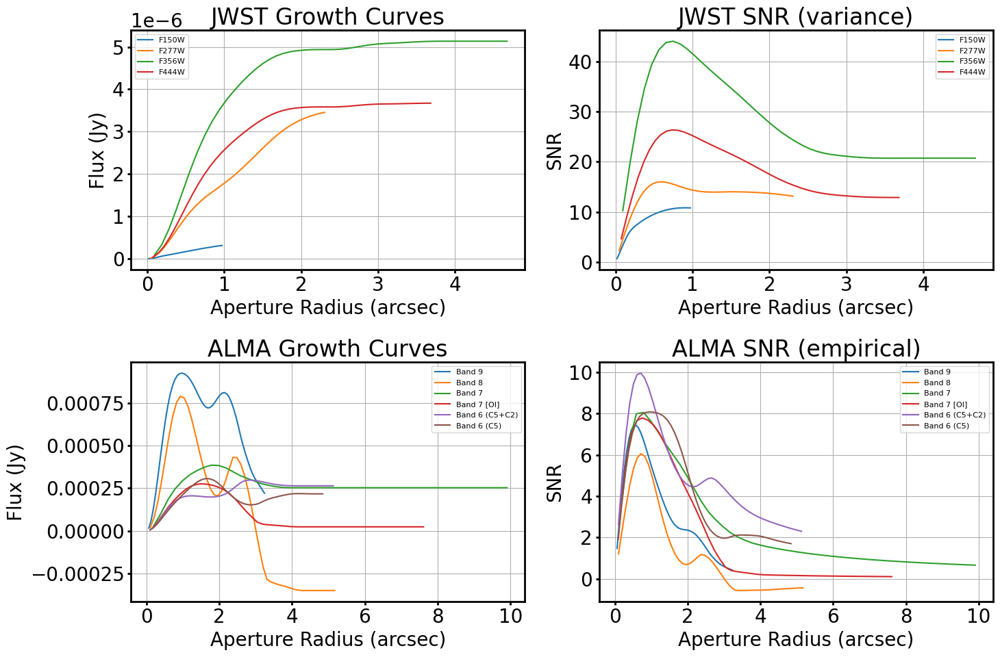

In [27]:
# ----------------------------------------------------------
# CELL: Growth & SNR Curves
# ----------------------------------------------------------

fig, axs = plt.subplots(2, 2, figsize=(15, 10))

# JWST
for band, res in jwst_free.items():
    axs[0,0].plot(res["r_arcsec"], res["flux"], label=band)
    axs[0,1].plot(res["r_arcsec"], res["snr"], label=band)

axs[0,0].set_title("JWST Growth Curves")
axs[0,1].set_title("JWST SNR (variance)")
axs[0,0].set_ylabel("Flux (Jy)")
axs[0,1].set_ylabel("SNR")

# ALMA
for band, res in alma_free.items():
    axs[1,0].plot(res["r_arcsec"], res["flux"], label=band)
    axs[1,1].plot(res["r_arcsec"], res["snr"], label=band)

axs[1,0].set_title("ALMA Growth Curves")
axs[1,1].set_title("ALMA SNR (empirical)")
axs[1,0].set_ylabel("Flux (Jy)")
axs[1,1].set_ylabel("SNR")

for ax in axs.flat:
    ax.set_xlabel("Aperture Radius (arcsec)")
    ax.grid(True)
    ax.legend(fontsize=8)

plt.tight_layout()
plt.show()


# Aperture Definition

In [28]:
ref_band = "F356W"
res = jwst_free[ref_band]

r = res["r_arcsec"]
snr = res["snr"]
flux = res["flux"]
x0, y0, a, b, th = res["geom"]

# Index of maximum SNR
i_max = np.nanargmax(snr)
r_snr_max = r[i_max]
snr_max = snr[i_max]

print(f"F356W: SNR max = {snr_max:.2f} at r = {r_snr_max:.2f} arcsec")

tol = 0.95 * snr_max
plateau_indices = np.where(snr >= tol)[0]

i_plateau = plateau_indices[0]
r_ref = r[i_plateau]

print(f"Chosen reference radius r_ref = {r_ref:.2f} arcsec (95% SNR plateau)")


s_ref = r_ref / (np.sqrt(a * b) * ref_pixscale)

print(f"Elliptical scale factor s_ref = {s_ref:.2f}")


F356W: SNR max = 44.00 at r = 0.75 arcsec
Chosen reference radius r_ref = 0.56 arcsec (95% SNR plateau)
Elliptical scale factor s_ref = 1.80


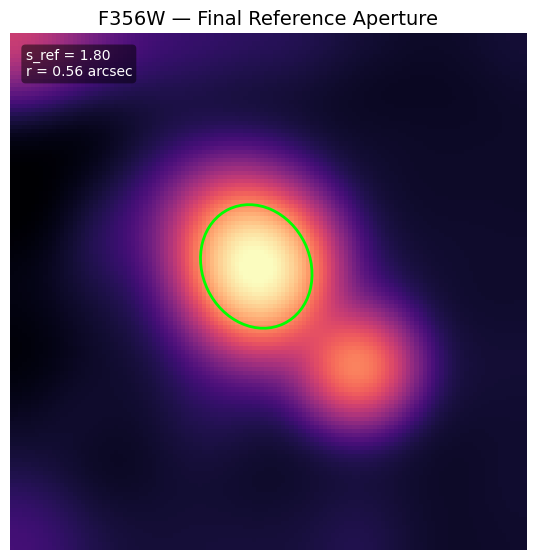

In [29]:
# ----------------------------------------------------------
# CELL: Reference Aperture Visualization (F356W)
# ----------------------------------------------------------

import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
from astropy.visualization import ImageNormalize, AsinhStretch, PercentileInterval
import numpy as np

# -------------------------------
# Extract reference band data
# -------------------------------
ref_band = "F356W"
idx = jwst_band_names.index(ref_band.lower())

img = jwst_flux_matched[idx]
res = jwst_free[ref_band]

x0, y0, a, b, th = res["geom"]

# -------------------------------
# Plot
# -------------------------------
fig, ax = plt.subplots(figsize=(6, 6))

interval = PercentileInterval(99.5)
vmin, vmax = interval.get_limits(img[np.isfinite(img)])
norm = ImageNormalize(vmin=vmin, vmax=vmax, stretch=AsinhStretch())

ax.imshow(img, origin="lower", cmap="magma", norm=norm)
ax.set_title(f"{ref_band} — Final Reference Aperture", fontsize=14)
ax.axis("off")

# Final aperture ellipse
ell = Ellipse(
    (x0, y0),
    width=2 * a * s_ref,
    height=2 * b * s_ref,
    angle=np.degrees(th),
    edgecolor="lime",
    facecolor="none",
    lw=2
)
ax.add_patch(ell)

# Optional annotation
ax.text(
    0.03, 0.97,
    f"s_ref = {s_ref:.2f}\nr = {r_ref:.2f} arcsec",
    transform=ax.transAxes,
    va="top", ha="left",
    fontsize=10,
    color="white",
    bbox=dict(facecolor="black", alpha=0.5, edgecolor="none", boxstyle="round")
)

plt.tight_layout()
plt.show()


In [31]:
# ----------------------------------------------------------
# CELL: Define Final Reference Aperture (F356W)
# ----------------------------------------------------------

import numpy as np

ref_band = "F356W"
res = jwst_free[ref_band]

# Geometry from free photometry
x0, y0, a, b, th = res["geom"]

# Growth & SNR curves
r = res["r_arcsec"]
snr = res["snr"]

# Max SNR
i_max = np.nanargmax(snr)
snr_max = snr[i_max]

# 95% SNR plateau
tol = 0.95 * snr_max
i_plateau = np.where(snr >= tol)[0][0]
r_ref = r[i_plateau]

# Elliptical scale factor
s_ref = r_ref / (np.sqrt(a * b) * ref_pixscale)

# Store aperture
final_aperture = {
    "band": ref_band,
    "x0": x0,
    "y0": y0,
    "a": a,
    "b": b,
    "theta": th,
    "s": s_ref,
    "r_arcsec": r_ref
}

print("Final aperture defined:")
for k, v in final_aperture.items():
    print(f"  {k}: {v}")


Final aperture defined:
  band: F356W
  x0: 58.60302697219309
  y0: 67.55247014798
  a: 8.461629867553711
  b: 7.177887439727783
  theta: -1.1236141920089722
  s: 1.7999999999999998
  r_arcsec: 0.5611226898379201


# Forced Photometry

In [32]:
# ----------------------------------------------------------
# CELL: Forced Photometry (Fixed Aperture from F356W)
# ----------------------------------------------------------

import numpy as np
import sep

# ----------------------------------------------------------
# Fixed aperture definition (from F356W)
# ----------------------------------------------------------
x0 = final_aperture["x0"]
y0 = final_aperture["y0"]
a  = final_aperture["a"]
b  = final_aperture["b"]
th = final_aperture["theta"]
s  = final_aperture["s"]

px_scale = ref_pixscale
subpix = 5

# Growth radii (same for all bands)
r_scale = np.linspace(0.3, 15.0, 50)
r_arcsec = r_scale * np.sqrt(a * b) * px_scale


def forced_photometry(img, var, band, is_alma=False):
    img = img.astype(np.float32)
    mask = np.isnan(img)

    # Background subtraction
    bkg = sep.Background(img, mask=mask)
    img_sub = img - bkg.back()

    flux, snr = [], []

    # ALMA empirical noise reference
    if is_alma:
        sigma_ref = alma_sigma_emp_ref[band]
        A_ref = np.pi * r_emp_pix**2

    for s_i in r_scale:
        f, e, _ = sep.sum_ellipse(
            img_sub,
            np.array([x0]), np.array([y0]),
            np.array([a * s_i]), np.array([b * s_i]),
            np.array([th]),
            err=np.sqrt(var),
            subpix=subpix
        )

        f = float(f[0])
        e = float(e[0])

        if is_alma:
            A = np.pi * (a * s_i) * (b * s_i)
            sigma = sigma_ref * np.sqrt(A / A_ref)
            snr.append(f / sigma if sigma > 0 else np.nan)
        else:
            snr.append(f / e if e > 0 else np.nan)

        flux.append(f)

    return {
        "flux": np.array(flux),
        "snr": np.array(snr),
        "r_arcsec": r_arcsec
    }


# ----------------------------------------------------------
# Run forced photometry
# ----------------------------------------------------------

jwst_forced = {}
alma_forced = {}

# JWST
for img, var, band in zip(jwst_flux_matched, jwst_variance_matched, jwst_band_names):
    res = forced_photometry(img, var, band.upper(), is_alma=False)
    jwst_forced[band.upper()] = res

# ALMA
for img, var, band in zip(alma_flux_matched, alma_variance_matched, alma_band_names_matched):
    res = forced_photometry(img, var, band, is_alma=True)
    alma_forced[band] = res

print("✅ Forced photometry completed (JWST + ALMA)")


✅ Forced photometry completed (JWST + ALMA)


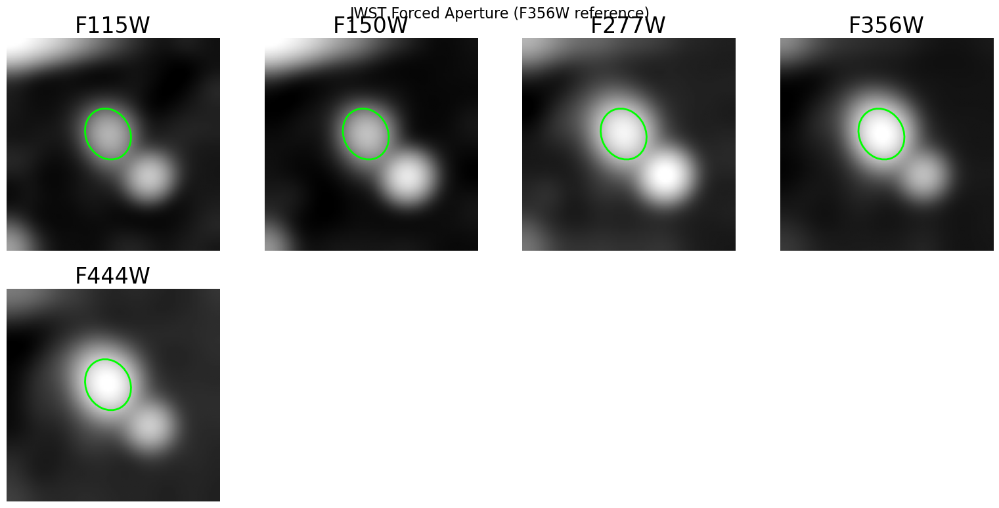

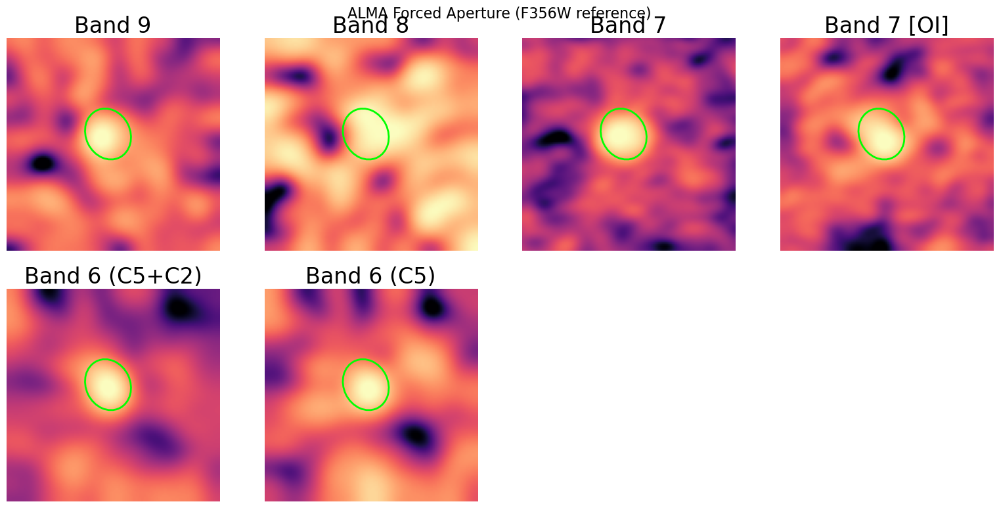

In [33]:
# ----------------------------------------------------------
# CELL: Forced Aperture Overlay (All Bands)
# ----------------------------------------------------------

import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
from astropy.visualization import ImageNormalize, AsinhStretch, PercentileInterval
from matplotlib import gridspec
import numpy as np

def plot_forced_apertures(images, labels, title, cmap):
    n = len(images)
    ncols = 4
    nrows = int(np.ceil(n / ncols))

    fig = plt.figure(figsize=(4 * ncols, 4 * nrows))
    gs = gridspec.GridSpec(nrows, ncols)

    for i, (img, lab) in enumerate(zip(images, labels)):
        ax = fig.add_subplot(gs[i])

        interval = PercentileInterval(99.5)
        vmin, vmax = interval.get_limits(img[np.isfinite(img)])
        norm = ImageNormalize(vmin=vmin, vmax=vmax, stretch=AsinhStretch())

        ax.imshow(img, origin="lower", cmap=cmap, norm=norm)
        ax.set_title(lab)
        ax.axis("off")

        ell = Ellipse(
            (x0, y0),
            width=2 * a * s,
            height=2 * b * s,
            angle=np.degrees(th),
            edgecolor="lime",
            facecolor="none",
            lw=2
        )
        ax.add_patch(ell)

    fig.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()


# JWST
plot_forced_apertures(
    jwst_flux_matched,
    [b.upper() for b in jwst_band_names],
    "JWST Forced Aperture (F356W reference)",
    cmap="gray"
)

# ALMA
plot_forced_apertures(
    alma_flux_matched,
    alma_band_names_matched,
    "ALMA Forced Aperture (F356W reference)",
    cmap="magma"
)


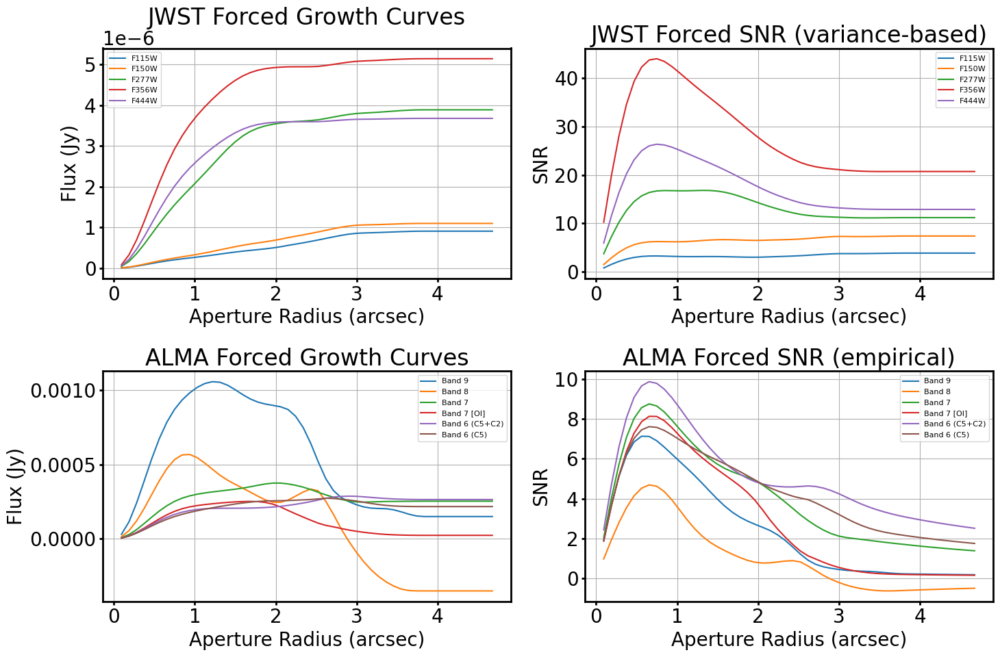

In [34]:
# ----------------------------------------------------------
# CELL: Forced Growth & SNR Curves
# ----------------------------------------------------------

import matplotlib.pyplot as plt

fig, axs = plt.subplots(2, 2, figsize=(15, 10))

# JWST
for band, res in jwst_forced.items():
    axs[0,0].plot(res["r_arcsec"], res["flux"], label=band)
    axs[0,1].plot(res["r_arcsec"], res["snr"], label=band)

axs[0,0].set_title("JWST Forced Growth Curves")
axs[0,1].set_title("JWST Forced SNR (variance-based)")
axs[0,0].set_ylabel("Flux (Jy)")
axs[0,1].set_ylabel("SNR")

# ALMA
for band, res in alma_forced.items():
    axs[1,0].plot(res["r_arcsec"], res["flux"], label=band)
    axs[1,1].plot(res["r_arcsec"], res["snr"], label=band)

axs[1,0].set_title("ALMA Forced Growth Curves")
axs[1,1].set_title("ALMA Forced SNR (empirical)")
axs[1,0].set_ylabel("Flux (Jy)")
axs[1,1].set_ylabel("SNR")

for ax in axs.flat:
    ax.set_xlabel("Aperture Radius (arcsec)")
    ax.grid(True)
    ax.legend(fontsize=8)

plt.tight_layout()
plt.show()


# Photometric catalog

In [35]:
# ----------------------------------------------------------
# CELL: Final Photometric Catalogue (Forced Photometry)
# ----------------------------------------------------------

import numpy as np
from astropy.table import Table

# ----------------------------------------------------------
# Helper: extract forced value at s_ref
# ----------------------------------------------------------

def extract_forced_value(res, s_ref, r_scale):
    """
    Extract flux, error, and SNR at the aperture scale closest to s_ref.
    """
    idx = np.argmin(np.abs(r_scale - s_ref))
    flux = res["flux"][idx]
    snr  = res["snr"][idx]
    err  = flux / snr if snr > 0 else np.nan
    return flux, err, snr


# ----------------------------------------------------------
# Define band metadata
# (adjust if you already have a central-wavelength table)
# ----------------------------------------------------------

# JWST NIRCam effective wavelengths (µm)
jwst_wavelength_um = {
    "F115W": 1.15,
    "F150W": 1.50,
    "F277W": 2.77,
    "F356W": 3.56,
    "F444W": 4.44
}

# ALMA effective wavelengths (µm)
alma_wavelength_um = {
    "Band 9": 450.0,
    "Band 8": 650.0,
    "Band 7": 870.0,
    "Band 7 [OI]": 870.0,
    "Band 6 (C5+C2)": 1300.0,
    "Band 6 (C5)": 1300.0
}

c = 2.99792458e8  # m/s

# ----------------------------------------------------------
# Build catalogue rows
# ----------------------------------------------------------

rows = []

# JWST
for band, res in jwst_forced.items():
    flux, err, snr = extract_forced_value(res, s_ref, r_scale)

    lam_um = jwst_wavelength_um[band]
    freq_hz = c / (lam_um * 1e-6)

    rows.append((
        band,
        lam_um,
        freq_hz,
        flux,
        err,
        snr
    ))

# ALMA
for band, res in alma_forced.items():
    flux, err, snr = extract_forced_value(res, s_ref, r_scale)

    lam_um = alma_wavelength_um[band]
    freq_hz = c / (lam_um * 1e-6)

    rows.append((
        band,
        lam_um,
        freq_hz,
        flux,
        err,
        snr
    ))

# ----------------------------------------------------------
# Create Astropy table
# ----------------------------------------------------------

catalog = Table(
    rows=rows,
    names=[
        "band",
        "wavelength_um",
        "frequency_hz",
        "flux_jy",
        "flux_err_jy",
        "snr"
    ]
)

catalog.sort("wavelength_um")

catalog


band,wavelength_um,frequency_hz,flux_jy,flux_err_jy,snr
str14,float64,float64,float64,float64,float64
F115W,1.15,260689093913043.53,1.4937729397618285e-07,4.723324986974147e-08,3.162545333808945
F150W,1.5,199861638666666.66,1.786794346647636e-07,2.983152647383056e-08,5.989617555156238
F277W,2.77,108228324187725.64,1.0915354058971265e-06,6.960689464660053e-08,15.68142655176523
F356W,3.56,84211364606741.58,2.101859139767016e-06,4.9719210147111846e-08,42.274588303955824
F444W,4.44,67520823873873.875,1.42879561573217e-06,5.717709293203863e-08,24.988951736851213
Band 9,450.0,666205462222.2223,0.0006736724611283763,9.444909965274437e-05,7.132650958084614
Band 8,650.0,461219166153.8462,0.0003908073861170181,8.629898729127318e-05,4.528528067171626
Band 7,870.0,344589032183.908,0.00018690637660682795,2.1815227542838453e-05,8.567702364772535
Band 7 [OI],870.0,344589032183.908,0.00013395255951380143,1.7038833858571596e-05,7.861603712182154


In [36]:
catalog.write("photometric_catalogue_forced.csv", format="csv", overwrite=True)
catalog.write("photometric_catalogue_forced.fits", overwrite=True)
